# Машинное обучение, ФКН ВШЭ

# Практическое задание 10. Обучение без учителя.

## Общая информация
Дата выдачи: 23.03.2022

Мягкий дедлайн: 06.04.2022 23:59 MSK

Жёсткий дедлайн: 10.04.2022 23:59 MSK

## Оценивание и штрафы

Каждая из задач имеет определенную «стоимость» (указана в скобках около задачи). Максимально допустимая оценка за работу — 10 баллов.

Сдавать задание после указанного срока сдачи нельзя. При выставлении неполного балла за задание в связи с наличием ошибок на усмотрение проверяющего предусмотрена возможность исправить работу на указанных в ответном письме условиях.

Задание выполняется самостоятельно. «Похожие» решения считаются плагиатом и все задействованные студенты (в том числе те, у кого списали) не могут получить за него больше 0 баллов (подробнее о плагиате см. на странице курса). Если вы нашли решение какого-то из заданий (или его часть) в открытом источнике, необходимо указать ссылку на этот источник в отдельном блоке в конце вашей работы (скорее всего вы будете не единственным, кто это нашел, поэтому чтобы исключить подозрение в плагиате, необходима ссылка на источник).

Неэффективная реализация кода может негативно отразиться на оценке.

## Формат сдачи
Задания сдаются через систему anytask. Посылка должна содержать:
* Ноутбук homework-practice-10-Username.ipynb

Username — ваша фамилия на латинице

## О задании

В этом задании мы посмотрим на несколько алгоритмов кластеризации и применим их к географическим и текстовым данным. Также мы подробно остановимся на тематическом моделировании текстов, задаче обучения представлений и в каком-то смысле поработаем с semi-supervised learning. 



In [1]:
import pandas as pd
import numpy as np

import haversine as hs

np.random.seed(0xFFFFFFF)

In [2]:
#!pip install openpyxl
#!pip install haversine
#!pip install folium
#!pip install wordcloud

**Задание 0 (1e-100 балла)**. Опишите свои ощущения от домашки по ЕМ-алгоритму (можно картинкой или мемом).

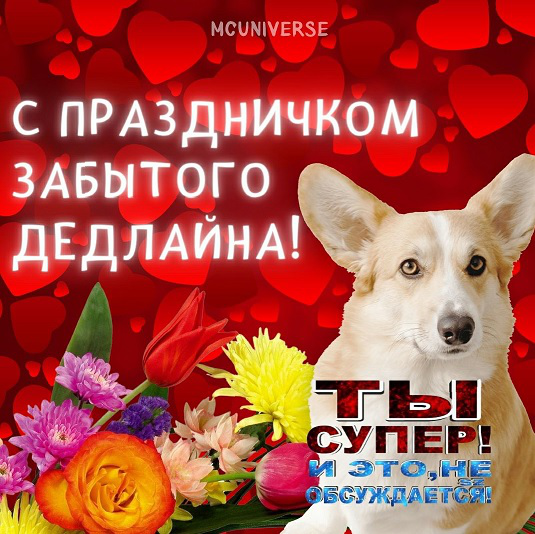

In [3]:
from PIL import Image
myimage = Image.open('pess.jpg')  
myimage

на самом деле я не забыла, просто мне не хватило моральных сил на это

## Часть 1. Кластеризация автобусных остановок

В этом задании мы сравним разные алгоритмы кластеризации для данных об автобусных остановках Москвы.

**Задание 1.1 (1 балл).** Реализуйте алгоритм спектральной кластеризации, который упоминался на лекции. Для этого разберитесь с кодом шаблона, данного ниже, и допишите недостающую функцию. Напомним, что для графа с матрицей смежности $W = \{w_{ij}\}_{i, j = 1 \dots \ell}$ лапласиан определяется как:

$$
L = D - W,
$$

где $D = \text{diag}(d_1, ..., d_{\ell}), d_i = \sum_{j=1}^{\ell} w_{ij}$.

In [4]:
from sklearn.base import ClusterMixin
from sklearn.cluster import KMeans


class GraphClustering(ClusterMixin):
    def __init__(self, n_clusters=8, n_components=None, **kwargs):
        '''
        Spectral clustering algorithm
        param n_clusters: number of clusters to form
        param n_components: number of eigenvectors to use
        '''

        if n_components is None:
            n_components = n_clusters

        self.n_components = n_components
        self.kmeans = KMeans(n_clusters=n_clusters, **kwargs)

    def fit_predict(self, X, y=None):
        '''
        Perform spectral clustering from graph adjacency matrix
        and return vertex labels.
        param X: (n_samples, n_samples) - graph adjacency matrix
        return: (n_samples, ) - vertex labels
        '''

        eigenvectors = self._generate_eigenvectors(X)
        labels = self.kmeans.fit_predict(eigenvectors[:, 1:])
        return labels

    def _generate_eigenvectors(self, X):
        '''
        Compute eigenvectors for spectral clustering
        param X: (n_samples, n_samples) - graph adjacency matrix
        return: (n_samples, n_components) - eigenvectors
        '''
        # определим матрицы D и L 
        D = np.diag(np.sum(X, axis=1))
        L = D - X
        
        # найдем собственные значения и собственные векторы
        values, vectors = np.linalg.eig(L)
        # отсортируем векторы по возрастанию сосбтвенных значений
        eigenvalues_sorted_index = np.argsort(values) 
        vectors = vectors[:, eigenvalues_sorted_index]
        
        # чтобы не выводить комплексные значения там где это не надо, возьмем real часть векторов
        return vectors.real[:,:self.n_components]
        
        raise NotImplementedError

Перед тем, как переходить к следующему заданию, протестируйте свое решение.

In [5]:
n_blocks, n_vertices = 10, 1000
block_vertices = n_vertices // n_blocks

X = np.zeros((n_vertices, n_vertices))
for i in range(0, n_vertices, block_vertices):
    X[i:i + block_vertices, i:i + block_vertices] = np.sqrt(i + 1)

graph_clustering = GraphClustering(n_clusters=n_blocks)
labels = graph_clustering.fit_predict(X)

true_labels = np.zeros(n_vertices, dtype=np.int32)
for i in range(0, n_vertices, block_vertices):
    true_labels[i:i + block_vertices] = labels[i]

assert labels.shape == (n_vertices, )
assert np.all(np.bincount(labels) == np.full(n_blocks, block_vertices))
assert np.all(labels == true_labels)

Теперь можем приступить к работе с реальными данными. Скачайте файл с данными об остановках общественного транспорта **в формате .xlsx** по [ссылке](https://data.mos.ru/opendata/download/60464/1/201) (так гарантированно не возникнет проблем с парсингом файла) и загрузите таблицу в ноутбук. Если вдруг сайт Правительства Москвы сойдет с ума, то возьмите какую-нибудь версию данных [отсюда](https://data.mos.ru/opendata/7704786030-city-surface-public-transport-stops). Для удобства визуализации мы будем работать только с остановками в ЦАО.

In [6]:
data = pd.read_excel('transport.xlsx',engine='openpyxl')
data = data[data.AdmArea_en == "Czentral`ny'j administrativny'j okrug"]
data = data.reset_index()
data.head()

,index,ID_en,Name_en,Longitude_WGS84_en,Latitude_WGS84_en,Street_en,AdmArea_en,District_en,RouteNumbers_en,StationName_en,Direction_en,Pavilion_en,OperatingOrgName_en,EntryState_en,global_id,geoData
0,278,347,"«2-й Лесной пер.», улица Бутырский Вал (347)",37.586584,55.782106,улица Бутырский Вал,Czentral`ny'j administrativny'j okrug,Tverskoj rajon,АТ18; А12; АТ56; АТ78,2-й Лесной пер.,NaN,да,ГУП «Мосгортранс»,active,889085436,NaN
1,279,349,"«Ул. Сущевский Вал», Новослободская улица (349)",37.590714,55.790630,Новослободская улица,Czentral`ny'j administrativny'j okrug,Tverskoj rajon,АТ47; АМ10; АТ3; АТ56; АТ78,Ул. Сущевский Вал,NaN,да,ГУП «Мосгортранс»,active,889085437,NaN
2,355,479,"«Стадион Лужники (южн.) (пос.)», улица Лужники...",37.565972,55.714265,улица Лужники,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Стадион Лужники (южн.) (пос.),NaN,да,ГУП «Мосгортранс»,active,889085549,NaN
3,356,480,"«Спортзал Дружба», Лужнецкая набережная (480)",37.570191,55.712504,Лужнецкая набережная,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Спортзал Дружба,NaN,да,ГУП «Мосгортранс»,active,889085550,NaN
4,357,481,"«Лужнецкая наб.», Лужнецкая набережная (481)",37.574559,55.713770,Лужнецкая набережная,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Лужнецкая наб.,NaN,да,ГУП «Мосгортранс»,active,889085551,NaN


(Зачем нижняя ячейка кода?)

Когда я писала код для следующих заданий, на каком-то этапе я поняла, что автобусные остановки определяются индексом, а не колонкой index. Или я пропустила, где это написано, или просто затупила, но в целом кажется это неочевидно)) Чтобы ничего не переписывать, теперь индексы стали новой колонкой index, а index стал index1.

In [7]:
data = data.rename(columns={"index": "index1"})
data['index'] = data.index
data.head()

,index1,ID_en,Name_en,Longitude_WGS84_en,Latitude_WGS84_en,Street_en,AdmArea_en,District_en,RouteNumbers_en,StationName_en,Direction_en,Pavilion_en,OperatingOrgName_en,EntryState_en,global_id,geoData,index
0,278,347,"«2-й Лесной пер.», улица Бутырский Вал (347)",37.586584,55.782106,улица Бутырский Вал,Czentral`ny'j administrativny'j okrug,Tverskoj rajon,АТ18; А12; АТ56; АТ78,2-й Лесной пер.,NaN,да,ГУП «Мосгортранс»,active,889085436,NaN,0
1,279,349,"«Ул. Сущевский Вал», Новослободская улица (349)",37.590714,55.790630,Новослободская улица,Czentral`ny'j administrativny'j okrug,Tverskoj rajon,АТ47; АМ10; АТ3; АТ56; АТ78,Ул. Сущевский Вал,NaN,да,ГУП «Мосгортранс»,active,889085437,NaN,1
2,355,479,"«Стадион Лужники (южн.) (пос.)», улица Лужники...",37.565972,55.714265,улица Лужники,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Стадион Лужники (южн.) (пос.),NaN,да,ГУП «Мосгортранс»,active,889085549,NaN,2
3,356,480,"«Спортзал Дружба», Лужнецкая набережная (480)",37.570191,55.712504,Лужнецкая набережная,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Спортзал Дружба,NaN,да,ГУП «Мосгортранс»,active,889085550,NaN,3
4,357,481,"«Лужнецкая наб.», Лужнецкая набережная (481)",37.574559,55.713770,Лужнецкая набережная,Czentral`ny'j administrativny'j okrug,rajon Xamovniki,А64; А216; А809; АС12; А255; АБК; АТ79,Лужнецкая наб.,NaN,да,ГУП «Мосгортранс»,active,889085551,NaN,4


Сначала напишу функцию, которая соотносит каждый маршрут со списком остановок, через которые он проходит.

In [8]:
# вот это первая функция

# разделяем остановки в строчках датафрейма
lst = data['RouteNumbers_en'].str.split('; ').to_list()
# соединяю все в один список
flat = [x for l in lst for x in l]
# удаляю повторяющиеся значения - получили список уникальных остановок
unique_routes = set(flat)

routes = {}
# для каждого маршрута будем проверять есть ли он в строчке - если есть, то добавляем остановку (индекс) в список
for j in unique_routes:
    routes[j] = []
    for i in range(len(data)):
        if j in data['RouteNumbers_en'][i]:
            routes[j].append(data['index'][i])
routes

{'А328': [55,
  56,
  80,
  81,
  84,
  85,
  122,
  140,
  142,
  415,
  416,
  417,
  418,
  506,
  508,
  556,
  557,
  646,
  796,
  797],
 'АТ47': [1,
  127,
  128,
  357,
  553,
  583,
  584,
  740,
  788,
  839,
  840,
  841,
  842,
  843,
  844,
  845,
  853,
  871,
  907,
  926],
 'АС12': [2,
  3,
  4,
  5,
  6,
  7,
  10,
  19,
  20,
  21,
  22,
  23,
  24,
  27,
  28,
  36,
  37,
  42,
  43,
  44,
  231,
  235,
  311,
  312,
  318,
  368,
  398,
  411,
  419,
  420,
  430,
  431,
  432,
  585,
  632,
  688,
  689,
  766,
  922,
  923,
  1016,
  1020,
  1021],
 'А184': [680, 723],
 'АТ66': [55,
  56,
  80,
  81,
  84,
  85,
  140,
  142,
  415,
  416,
  417,
  418,
  435,
  506,
  507,
  508,
  567,
  568,
  569,
  570,
  571,
  572,
  573,
  580,
  581,
  642,
  643,
  646,
  796,
  797],
 'А9': [114,
  118,
  131,
  133,
  138,
  280,
  281,
  282,
  283,
  408,
  450,
  455,
  456,
  457,
  653,
  662,
  683,
  684,
  711,
  713,
  727,
  731,
  732,
  733,
  749,
  915,
 

Как буду считать расстояния?

Вот так:
https://towardsdatascience.com/calculating-distance-between-two-geolocations-in-python-26ad3afe287b.

Использую библиотеку haversine, считаю расстояние между двумя координатами и получаю расстояние в километрах.

In [9]:
# пример 
loc1=(data['Longitude_WGS84_en'][0], data['Latitude_WGS84_en'][0]) 
loc2=(data['Longitude_WGS84_en'][1], data['Latitude_WGS84_en'][1])
hs.haversine(loc1,loc2)

0.8802807016146975

In [10]:
# запилим из этого маленькую функцию, чтобы забыть о сложностях рассчета расстояний 
def distance(loc1, loc2):
    return hs.haversine(loc1,loc2)

Теперь реализую вторую функцию - которая упорядочивает остановки в маршруте. У меня логика такая:
    
1) На вход получаем список остановок для одного маршрута.

2) Считаем расстояния от каждой остановки до каждой. И получаем матрицу расстояний (с нулевой диагональю).

3) Ищем точку самую удаленную от всех остальных. Будем считать, что самая удаленная точка - это та, у которой сумма расстояний до всех остальных точек максимальна. Поэтому просто посчитаем суммы (по любой оси, тк матрица симметрична) и возьмем индекс максимальной.

4) Дальше будем записывать индексы в список и по строчкам искать минимальное расстояние среди тех индексов, которых еще нет в списке. Короче жадный алгоритм. Получим список индексов - в каком порядке должны идти остановки в маршруте.

5) Обновляем словарь с остановками, чтобы они упорядочились в соотвествии с порядком индексов, полученным на прошлом шаге.

6) Готово!

In [11]:
# запилим матрицу расстояний для остановок маршрута 
# на одном маршруте отладка, а потом все пойдет в цикл

stops = routes['А552']
distances = []
for i in stops:
    locations=[]
    for j in stops:
        dst = distance((data['Longitude_WGS84_en'][data['index'] == i], data['Latitude_WGS84_en'][data['index'] == i]),
                       (data['Longitude_WGS84_en'][data['index'] == j], data['Latitude_WGS84_en'][data['index'] == j]))
        locations.append(dst)
    distances.append(locations)

In [12]:
# вот что у нас получилось 
np.array(distances)

array([[0.        , 0.36490804, 0.3055301 , 0.07048002, 0.1580135 ,
        0.18938273, 0.34622819, 0.32660667],
       [0.36490804, 0.        , 0.06627974, 0.31521603, 0.43247914,
        0.47041177, 0.37344889, 0.32817687],
       [0.3055301 , 0.06627974, 0.        , 0.25197523, 0.38815748,
        0.42689935, 0.31914242, 0.27419924],
       [0.07048002, 0.31521603, 0.25197523, 0.        , 0.21981172,
        0.25433238, 0.28222996, 0.25926826],
       [0.1580135 , 0.43247914, 0.38815748, 0.21981172, 0.        ,
        0.03903186, 0.50178993, 0.47869434],
       [0.18938273, 0.47041177, 0.42689935, 0.25433238, 0.03903186,
        0.        , 0.53523506, 0.51359987],
       [0.34622819, 0.37344889, 0.31914242, 0.28222996, 0.50178993,
        0.53523506, 0.        , 0.04527209],
       [0.32660667, 0.32817687, 0.27419924, 0.25926826, 0.47869434,
        0.51359987, 0.04527209, 0.        ]])

In [13]:
# индекс элемента с максимальной суммой расстояний
np.argmax(np.sum(np.array(distances), axis = 1)) 

5

In [14]:
# жадно выбираем порядок остановок
sorted_stops=[]
sorted_stops.append(5)
next_stop = 5
for i in range(7): 
    next_min_distance = np.min(np.delete(np.array(distances)[next_stop], sorted_stops))
    next_stop = list(np.array(distances)[next_stop]).index(next_min_distance)
    sorted_stops.append(next_stop)
sorted_stops

[5, 4, 0, 3, 2, 1, 7, 6]

In [15]:
# было 
routes['А552']

[501, 502, 504, 505, 587, 599, 822, 823]

In [16]:
# стало
list(np.array(routes['А552'])[sorted_stops])

[599, 587, 501, 505, 504, 502, 823, 822]

In [17]:
# вот это вторая функция 
for key, value in routes.items():
    
    # запилим матрицу расстояний для остановок маршрута 
    stops = value
    distances = []
    for i in stops:
        j_dist=[]
        for j in stops:
            dst = distance((data['Longitude_WGS84_en'][data['index'] == i], data['Latitude_WGS84_en'][data['index'] == i]),
                           (data['Longitude_WGS84_en'][data['index'] == j], data['Latitude_WGS84_en'][data['index'] == j]))
            j_dist.append(dst)
        distances.append(j_dist)
        
    # индекс элемента с максимальной суммой расстояний
    next_stop = np.argmax(np.sum(np.array(distances), axis = 1)) 
    
    # сортировка остановок
    sorted_stops=[]
    sorted_stops.append(next_stop)
    for i in range(len(distances)-1): 
        next_min_distance = np.min(np.delete(np.array(distances)[next_stop], sorted_stops))
        next_stop = list(np.array(distances)[next_stop]).index(next_min_distance)
        sorted_stops.append(next_stop)
        
        sorted_value = list(np.array(value)[sorted_stops])
        # обновляем словарь с остановками
        upd = {key:sorted_value}
        
        routes.update(upd)
routes

{'А328': [556,
  557,
  55,
  56,
  646,
  80,
  85,
  84,
  81,
  122,
  140,
  142,
  415,
  417,
  416,
  418,
  797,
  796,
  506,
  508],
 'АТ47': [553,
  357,
  871,
  926,
  788,
  740,
  584,
  583,
  844,
  843,
  127,
  842,
  128,
  907,
  841,
  853,
  840,
  845,
  1,
  839],
 'АС12': [411,
  368,
  42,
  10,
  922,
  923,
  235,
  37,
  20,
  7,
  21,
  231,
  22,
  6,
  23,
  36,
  44,
  5,
  24,
  688,
  689,
  1016,
  2,
  585,
  28,
  3,
  27,
  4,
  311,
  632,
  318,
  312,
  398,
  1021,
  1020,
  430,
  420,
  431,
  419,
  432,
  43,
  19,
  766],
 'А184': [680, 723],
 'АТ66': [508,
  506,
  796,
  797,
  418,
  416,
  417,
  415,
  142,
  140,
  81,
  84,
  85,
  80,
  646,
  56,
  55,
  643,
  567,
  642,
  568,
  569,
  435,
  572,
  571,
  581,
  570,
  573,
  580,
  507],
 'А9': [281,
  282,
  283,
  280,
  450,
  455,
  457,
  456,
  653,
  684,
  998,
  713,
  408,
  711,
  980,
  997,
  996,
  988,
  969,
  989,
  968,
  967,
  970,
  971,
  966,
  1007,


Теперь третья функция - матрица смежности для остановок. 

Логика:

1) Создаем матрицу из нулей размера nxn, где n - количество остановок

2) Будем итерироваться по парам остановок. Получили пару - для каждой проверяем:
- есть ли обе остановки в маршруте?
- если есть, являются ли они соседними? (разница индексов в списке равна 1 по модулю)
- если да, плюсуем маршрут к счетчику

3) Таким образом, для каждой пары у нас есть счетчик - на скольких маршрутах две остановки являются соседними. Заполняем матрицу этими значениями.

Ну и вроде на этом все. Тут диагональ получается нулевая, из-за того что когда мы проверяем условия для двух одинаковых остановок, они не выполняются, поэтому в счетчик не плюсуется ничего. (Типа у одной и той же остановки не может быть разница индексов = 1)

In [18]:
adj = np.zeros((len(data['index']), len(data['index'])))
for i in range(len(data['index'])):
    for j in range(len(data['index'])):
        counter = 0
        stop1, stop2 = data['index'][i], data['index'][j]
        for value in routes.values():
            if (stop1 in value) and (stop2 in value):
                if abs(value.index(stop1)-value.index(stop2)) == 1:
                    counter += 1
        adj[i][j]=counter

In [19]:
# посмотрим, что получилось
adj

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]])

In [20]:
# проверяю все ли ок и есть ли тут ненулевые элементы
np.nonzero(adj)

(array([   0,    0,    1, ..., 1035, 1036, 1036], dtype=int64),
 array([  45,   46,  828, ..., 1031,  894, 1033], dtype=int64))

In [21]:
# нулевая диагональ матрицы смежности
np.nonzero(np.diag(adj))

(array([], dtype=int64),)

Воспользуемся библиотекой `folium` для визуализации данных.

In [22]:
import folium

map = folium.Map([55.75215, 37.61819], zoom_start=12)
for id, row in data.iterrows():
    folium.Circle([row.Latitude_WGS84_en, row.Longitude_WGS84_en],
                  radius=10).add_to(map)
map

**Задание 1.2 (1 балл).** Попробуем построить граф, в котором вершинами будут остановки. Как вы уже могли заметить, для каждой остановки указаны номера маршрутов, проходящих через неё. Логично соединить ребрами соседние остановки каждого маршрута. Однако мы не знаем, в каком порядке автобусы объезжают остановки. Но мы можем применить эвристический алгоритм, который восстановит нам порядок маршрутов:

* Для каждого маршрута выделим список всех остановок, через которые он проходит.
* Выберем начальную остановку маршрута как точку, наиболее удаленную от всех остальных остановок этого маршрута.
* Каждую следующую точку маршрута будем выбирать как самую близкую из оставшихся точек (не включенных в маршрут ранее).

Фактически, у нас получается жадное решение задачи коммивояжера. Когда мы отсортировали маршруты, можем построить по ним граф. Будем строить его по таким правилам:

* Между двумя остановками будет ребро, если они являются соседними хотя бы на одном маршруте. Вес ребра равен числу маршрутов, на которых остановки являются соседними.
* В графе не будет петель (то есть у матрицы смежности будет нулевая диагональ).

Реализуйте предложенный способ построения графа. Для этого рекомендуется воспользоваться шаблонами, приведенными ниже.

In [23]:
def get_routes(data):
    '''
    Accumulate routes from raw data
    param data: pd.DataFrame - public transport stops data
    return: dict - unsorted stops ids for each route,
                   e.g. routes['A1'] = [356, 641, 190]
    '''
    # создаем список из уникальных маршрутов
    lst = data['RouteNumbers_en'].str.split('; ').to_list()
    flat = [x for l in lst for x in l]
    unique_routes = set(flat)

    # создаем словарь с остановками для каждого маршрута
    routes = {}
    for j in unique_routes:
        routes[j] = []
    
        for i in range(len(data)):
            if j in data['RouteNumbers_en'][i]:
                routes[j].append(data['index'][i])
                
    return routes
       
    raise NotImplementedError


def sort_routes(data, routes):
    '''
    Sort routes according to the proposed algorithm
    param data: pd.DataFrame - public transport stops data
    param routes: dict - unsorted stops ids for each route
    return: dict - sorted stops ids for each route
    '''
    # на всякий случай делаем копию словаря из 1 функции - это будет новый словарь
    sorted_routes = routes.copy()
    for key, value in routes.items():
    
    # матрица расстояний для остановок маршрута 
        stops = value
        distances = []
        for i in stops:
            j_dist=[]
            for j in stops:
                dst = distance((data['Longitude_WGS84_en'][data['index'] == i], data['Latitude_WGS84_en'][data['index'] == i]),
                               (data['Longitude_WGS84_en'][data['index'] == j], data['Latitude_WGS84_en'][data['index'] == j]))
                j_dist.append(dst)
            distances.append(j_dist)
        
        # индекс элемента с максимальной суммой расстояний - с него начинаем выстраивать порядок остановок
        next_stop = np.argmax(np.sum(np.array(distances), axis = 1)) 
        
        # ищем минимальные расстояния и упорядочиваем остановки 
        sorted_stops=[]
        sorted_stops.append(next_stop)
        for i in range(len(distances)-1): 
            next_min_distance = np.min(np.delete(np.array(distances)[next_stop], sorted_stops))
            next_stop = list(np.array(distances)[next_stop]).index(next_min_distance)
            sorted_stops.append(next_stop)
        
            sorted_value = list(np.array(value)[sorted_stops])
            upd = {key:sorted_value}
        
            sorted_routes.update(upd)
            
    return sorted_routes
    
    raise NotImplementedError


def get_adjacency_matrix(data, sorted_routes):
    '''
    Compute adjacency matrix for sorted routes
    param data: pd.DataFrame - public transport stops data
    param sorted_routes: dict - sorted stops ids for each route
    return: (n_samples, n_samples) - graph adjacency matrix
    '''
    # рисуем граф
    adj = np.zeros((len(data['index']), len(data['index'])))
    for i in range(len(data['index'])):
        for j in range(len(data['index'])):
            counter = 0
            stop1, stop2 = data['index'][i], data['index'][j]
            for value in sorted_routes.values():
                if (stop1 in value) and (stop2 in value):
                    if abs(value.index(stop1)-value.index(stop2)) == 1:
                        counter += 1
            adj[i][j]=counter
    
    return adj
    
    raise NotImplementedError

In [24]:
routes = get_routes(data)
sorted_routes = sort_routes(data, routes)
adjacency_matrix = get_adjacency_matrix(data, sorted_routes)

Проверим, что маршруты получились адекватными. Для этого нарисуем их на карте.

In [25]:
map = folium.Map([55.75215, 37.61819], zoom_start=12)
for route_id in np.random.choice(list(sorted_routes.keys()), size=5):
    coords = data.loc[
        sorted_routes[route_id],
        ['Latitude_WGS84_en', 'Longitude_WGS84_en']
    ].values.tolist()
    folium.vector_layers.PolyLine(coords).add_to(map)

map

**Задание 1.3 (0 баллов)**. Реализуйте функцию `draw_clustered_map`, которая рисует карту центра Москвы с кластерами остановок, раскрашенными в разные цвета.

In [26]:
def draw_clustered_map(data, labels):
    '''
    Create map with coloured clusters
    param data: pd.DataFrame - public transport stops data
    param labels: (n_samples, ) - cluster labels for each stop
    return: folium.Map - map with coloured clusters
    '''
    colors=['red', 'blue', 'green', 'purple', 'orange', 'darkred',
            'lightred', 'beige', 'darkblue', 'darkgreen', 'cadetblue', 'darkpurple',
            'white', 'pink', 'lightblue', 'lightgreen', 'gray', 'black', 'lightgray']
    map = folium.Map([55.75215, 37.61819], zoom_start=12)
    for id, row in data.iterrows():
        folium.Circle([row.Latitude_WGS84_en, row.Longitude_WGS84_en],
                  radius=10, color=colors[labels[id]]).add_to(map)
    return map

**Задание 1.4 (1.5 балла)**. Примените алгоритмы кластеризации K-Means и DBSCAN из `sklearn` на координатах остановок, а также свою реализацию спектральной кластеризации на построенной выше матрице смежности. Визуализируйте результат кластеризации с помощью функции `draw_clustered_map`. Подберите параметры алгоритмов (`n_clusters` у K-Means, `eps` у DBSCAN, `n_clusters` и `n_components` у спектральной кластеризации) так, чтобы получить наиболее характерный для этих алгоритмов результат кластеризации (можете поэкспериментировать и оставить в ноутбуке картинки только для итоговых значений параметров, также обратите внимание на баланс объектов в кластерах). Не забудьте, что DBSCAN помечает некоторые точки как шумовые (можно раскрасить их в отдельный цвет).

In [27]:
coords = pd.DataFrame({"latitude": data['Latitude_WGS84_en'],"longitude": data['Longitude_WGS84_en']})
coords

,latitude,longitude
0,55.782106,37.586584
1,55.790630,37.590714
2,55.714265,37.565972
3,55.712504,37.570191
4,55.713770,37.574559
...,...,...
1032,55.745463,37.637040
1033,55.768215,37.554929
1034,55.793561,37.634917
1035,55.725723,37.612374


In [28]:
kmeans = KMeans(n_clusters=6, random_state=420)
draw_clustered_map(data, kmeans.fit_predict(coords))

In [29]:
from sklearn.cluster import DBSCAN

dbscan = DBSCAN(eps=0.005, min_samples=9) # подобрать 
draw_clustered_map(data, dbscan.fit_predict(coords))

In [30]:
graph_clustering = GraphClustering(n_clusters=17, n_components=25)
labels = graph_clustering.fit_predict(adjacency_matrix)
draw_clustered_map(data, labels)

Проинтерпретируйте полученные результаты. Чем отличаются разбиения на кластеры, получаемые разными алгоритмами? Какие плюсы и минусы есть у каждого алгоритма? Какой алгоритм кажется вам наиболее подходящим для кластеризации остановок?

**Ответ:**

K-means - показывает более "географичное" распределение кластеров. В один кластер попадают остановки, которые расположены близко друг к другу. Этот метод хорош, если мы хотим кластеризовать остановки по районам / по местоположению. Однако, у него есть и свои недостатки. Самый главный заключается в том, что он не способен выявить более сложные закономерности в данных, если таковые есть. Еще из минусов - зависимость от параметра n_clusters, разделения на кластеры будут сильно отличаться в зависимости от их количества (очевидно). Также может давать разные результаты в заивисимости от параметра рандома (начальное приближение первых центров кластеров)

DBSCAN и спектральная кластеризация, в данном случае, кажутся немного умнее, потому что выявляют более сложные зависимости - не только непосредственно расстояние. 

DBSCAN не требует знания количества кластеров, но зато сильно зависит от параметра eps - окрестности. Если параметр будет слишком высоким - все остановки попадают в один кластер. Поэтому здесь мне потребовалось время, чтобы найти такой eps, который будет выдавать какое-то хотя бы разумное распределение кластеров. Кроме того, могут возникать сложности, если в данных существуют области с разной плотностью. DBSCAN еще хорош тем, что может выделять в отдельную категорию шумовые точки. Но, не уверена, что в данной задаче это полезная фича. Скорее, хорошо то, что DBSCAN здесь видит маршруты.

Спектральная кластеризация (на визуализации кластеров на карте) показывает что-то близкое к DBSCAN.Спектральная кластеризация в меньшей степени учитывает именно географическую близость объектов. Здесь еще лучше учитываются маршруты, на которых расположены остановки. Однако, здесь тоже есть очень сильная зависимость качества кластеризации от гиперпараметра. Недостатком данного метода может также служить то, что он обучается дольше ввиду большей вычислительной сложности. Т.е. помимо самого алгоритма K-means, прежде всего нужно сделать вычисления с матрицами, найти собственные векторы и.т.д.

Полагаю, в данной задаче лучшим методом может быть как раз спектральная кластеризация, поскольку она призвана лучшего всего учитывать маршруты. Однако, выбор метода, на мой взгляд, все-таки зависит от того, что именно мы хотим получить от кластеризации остановок.

## Часть 2. Тематическое моделирование текстов

В этой части мы познакомимся с одной из самых популярных задач обучения без учителя &mdash; с задачей тематического моделирования текстов. Допустим, нам доступна некоторая коллекция документов без разметки, и мы хотим автоматически выделить несколько тем, которые встречаются в документах, а также присвоить каждому документу одну (или несколько) тем. Фактически, мы будем решать задачу, похожую на кластеризацию текстов: отличие в том, что нас будет интересовать не только разбиение текстов на группы, но и выделение ключевых слов, определяющих каждую тему.

Мы будем работать с новостными статьями BBC за 2004-2005 годы. Скачайте данные по [ссылке](https://www.kaggle.com/hgultekin/bbcnewsarchive).

In [31]:
data = pd.read_csv('bbc-news-data.csv', sep='\t')
data.sample(5)

,category,filename,title,content
954,politics,059.txt,'Debate needed' on donations cap,A cap on donations to political parties shoul...
35,business,036.txt,US gives foreign firms extra time,Foreign firms have been given an extra year t...
397,business,398.txt,Tsunami to cost Sri Lanka $1.3bn,Sri Lanka faces a $1.3bn (£691m) bill in 2005...
72,business,073.txt,German growth goes into reverse,Germany's economy shrank 0.2% in the last thr...
579,entertainment,070.txt,Children vote Shrek 2 best film,Young UK film fans voted animated Hollywood h...


Как вы могли заметить, данные уже содержат разметку по тематике (колонка category). В этой части мы забудем, что она есть, и будем работать только с текстовыми данными. Проведем предобработку текста, состоящую из следующих пунктов:

* Объединим заголовок и содержание статьи в одно поле.
* Приведем текст к нижнему регистру, разобьем его на токены.
* Оставим только буквенные слова (удалив, таким образом, пунктуацию и числа).
* Применим лемматизацию.
* Удалим стоп-слова.


In [32]:
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer

In [33]:
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')

stop_words = set(stopwords.words('english') + ['ha', 'wa', 'say', 'said'])
lemmatizer = WordNetLemmatizer()

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\Анастасия\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\Анастасия\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Анастасия\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [34]:
def preprocess(text):
    text = list(filter(str.isalpha, word_tokenize(text.lower())))
    text = list(lemmatizer.lemmatize(word) for word in text)
    text = list(word for word in text if word not in stop_words)
    return ' '.join(text)

In [35]:
data['raw_text'] = data.apply(lambda row: row.title + row.content, axis=1)
data['text'] = data.apply(lambda row: preprocess(row.raw_text), axis=1)

Для визуализации частот слов в текстах мы будем использовать [облака тегов](https://en.wikipedia.org/wiki/Tag_cloud).

In [36]:
from wordcloud import WordCloud

def draw_wordcloud(texts, max_words=1000, width=1000, height=500):
    wordcloud = WordCloud(background_color='white', max_words=max_words,
                          width=width, height=height)
    
    joint_texts = ' '.join(list(texts))
    wordcloud.generate(joint_texts)
    return wordcloud.to_image()

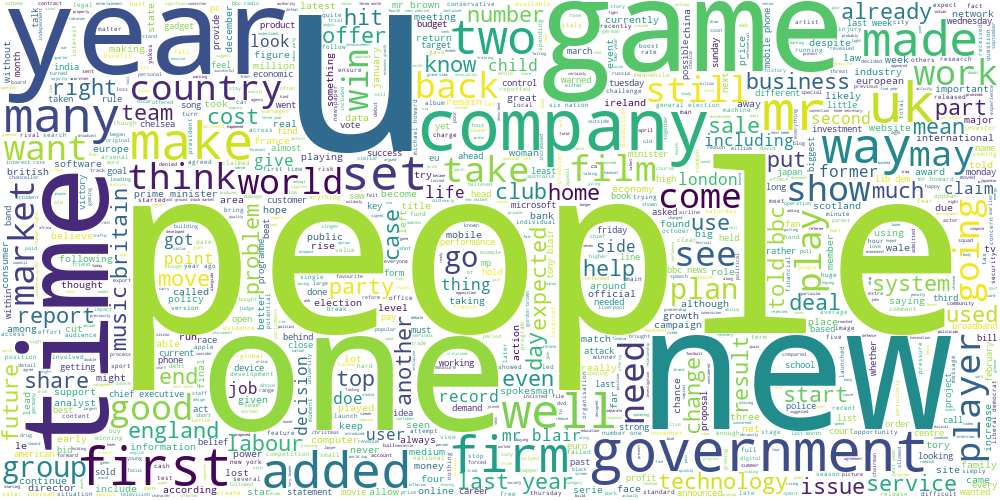

In [37]:
draw_wordcloud(data.text)

**Задание 2.1 (1 балл).** Обучите алгоритм K-Means на tf-idf представлениях текстов. При обучении tf-idf векторайзера рекомендуется отбрасывать редко встречающиеся слова, а также воздержитесь от использования N-грамм. Возьмите не очень большое число кластеров, чтобы было удобно интерпретировать получившиеся темы (например, `n_clusters` = 8). Постройте облака тегов для текстов из разных кластеров. Получились ли темы интерпретируемыми? Попробуйте озаглавить каждую тему.

**Ответ:** ответ ниже, после вывода облаков слов

In [38]:
data['text'][0]

'ad sale boost time warner profit quarterly profit u medium giant timewarner jumped three month december firm one biggest investor google benefited sale internet connection higher advert sale timewarner fourth quarter sale rose profit buoyed gain offset profit dip warner bros le user aol time warner friday owns google internet business aol mixed fortune lost subscriber fourth quarter profit lower preceding three quarter however company aol underlying profit exceptional item rose back stronger internet advertising revenue hope increase subscriber offering online service free timewarner internet customer try sign aol existing customer broadband timewarner also restate result following probe u security exchange commission sec close concluding time warner fourth quarter profit slightly better analyst expectation film division saw profit slump helped flop alexander catwoman sharp contrast third final film lord ring trilogy boosted result timewarner posted profit performance revenue grew fin

Посмотрели на текст, поняли, что тут нет стоп-слов и знаков пунктуации. В целом необходимая предобработка уже сделана, так что можно это скормить в vectorizer.

In [39]:
from sklearn.feature_extraction.text import TfidfVectorizer

# max_features - параметр который удаляет редко встречающиеся слова (обрезает пось признаков - то есть слов)
# остальные по дефолту удовлетворяют рекомендациям задания
vectorizer = TfidfVectorizer(max_features=20000)
X = vectorizer.fit_transform(data['text'])

In [40]:
X.shape

(2225, 20000)

Тут мы видим, что будем использовать 20К первых (более часто встречающихся) признаков. Как и было заявлено. Just chekin

In [41]:
kmeans = KMeans(n_clusters=8, random_state=420).fit(X)
labels = kmeans.labels_
labels

array([5, 2, 5, ..., 7, 7, 7])

In [42]:
# это для того, чтобы дальше было удобно рисовать облака текстов по разным кластерам
data['cluster_label'] = labels
data.head()

,category,filename,title,content,raw_text,text,cluster_label
0,business,001.txt,Ad sales boost Time Warner profit,Quarterly profits at US media giant TimeWarne...,Ad sales boost Time Warner profit Quarterly pr...,ad sale boost time warner profit quarterly pro...,5
1,business,002.txt,Dollar gains on Greenspan speech,The dollar has hit its highest level against ...,Dollar gains on Greenspan speech The dollar ha...,dollar gain greenspan speech dollar hit highes...,2
2,business,003.txt,Yukos unit buyer faces loan claim,The owners of embattled Russian oil giant Yuk...,Yukos unit buyer faces loan claim The owners o...,yukos unit buyer face loan claim owner embattl...,5
3,business,004.txt,High fuel prices hit BA's profits,British Airways has blamed high fuel prices f...,High fuel prices hit BA's profits British Airw...,high fuel price hit ba profit british airway b...,5
4,business,005.txt,Pernod takeover talk lifts Domecq,Shares in UK drinks and food firm Allied Dome...,Pernod takeover talk lifts Domecq Shares in UK...,pernod takeover talk lift domecq share uk drin...,5


Cluster 0


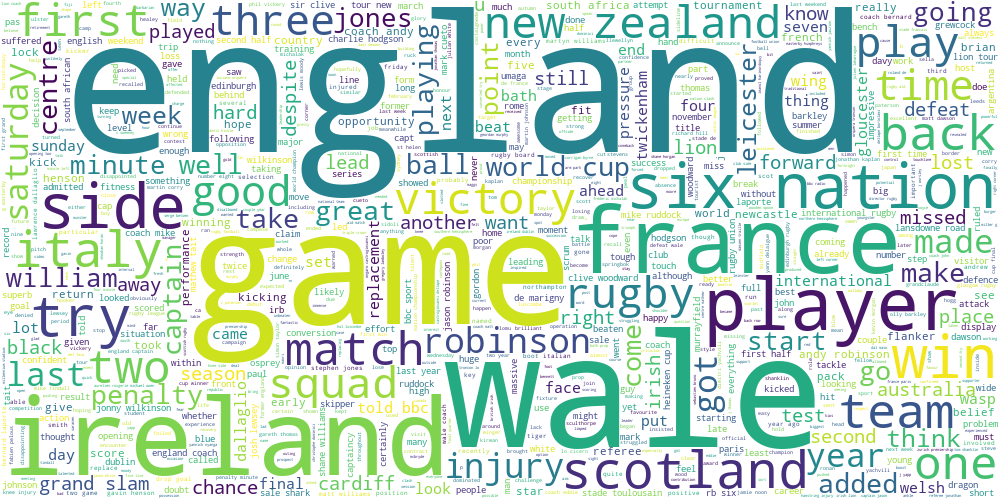

Cluster 1


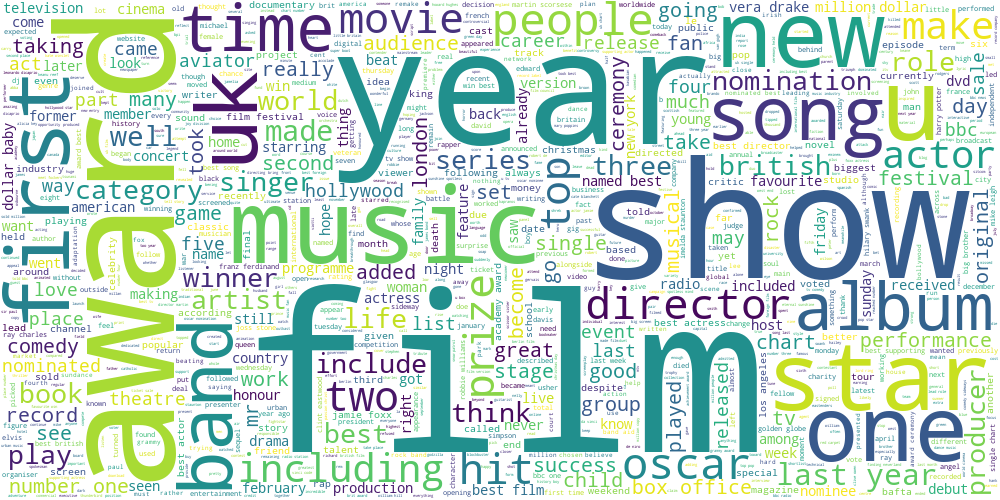

Cluster 2


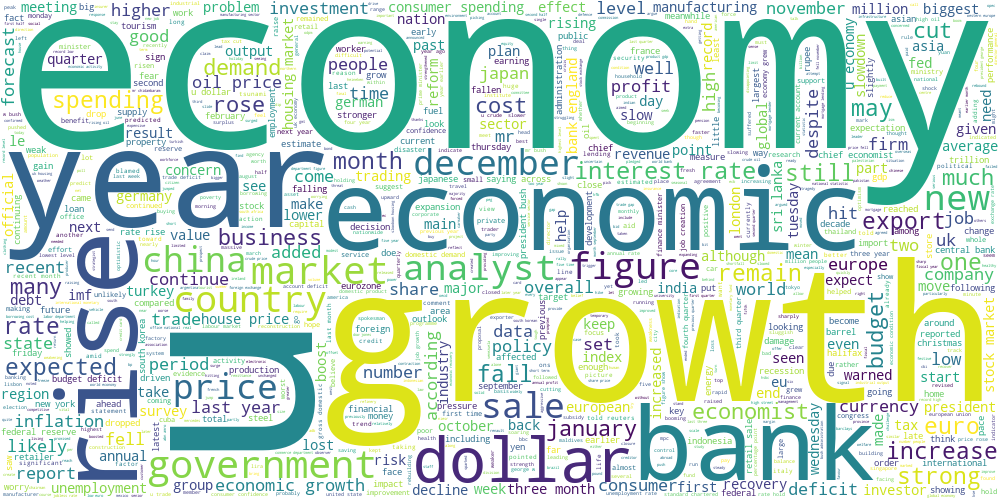

Cluster 3


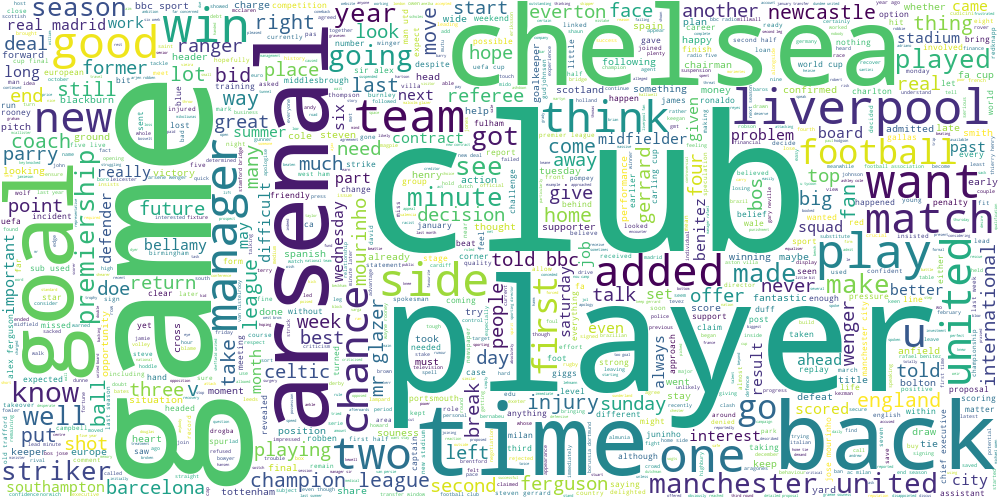

Cluster 4


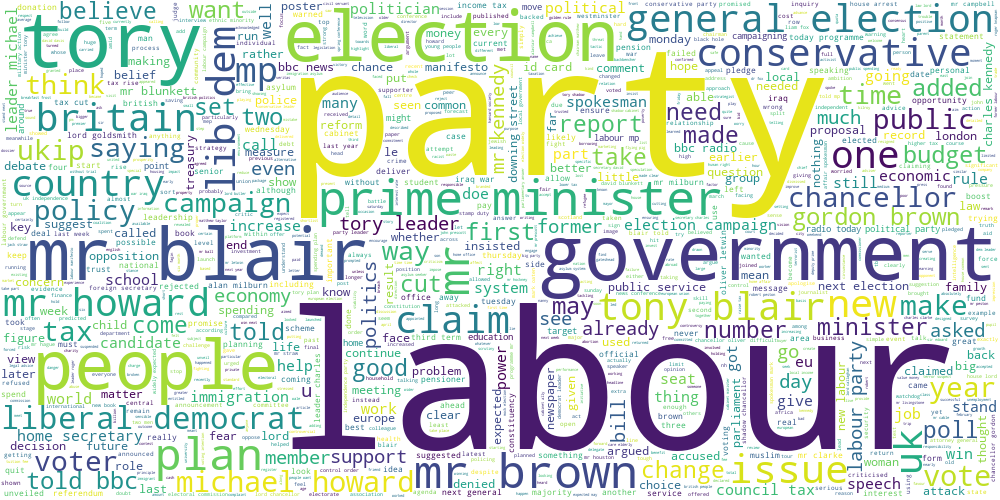

Cluster 5


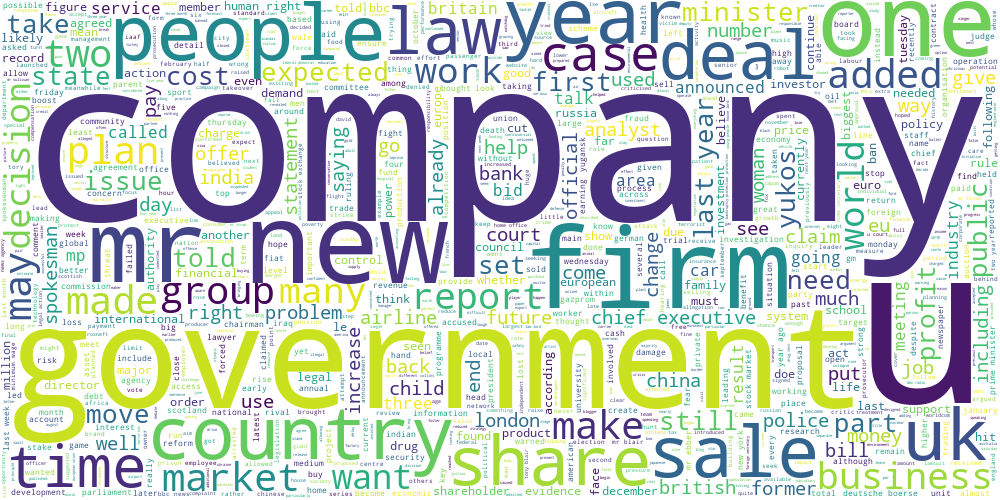

Cluster 6


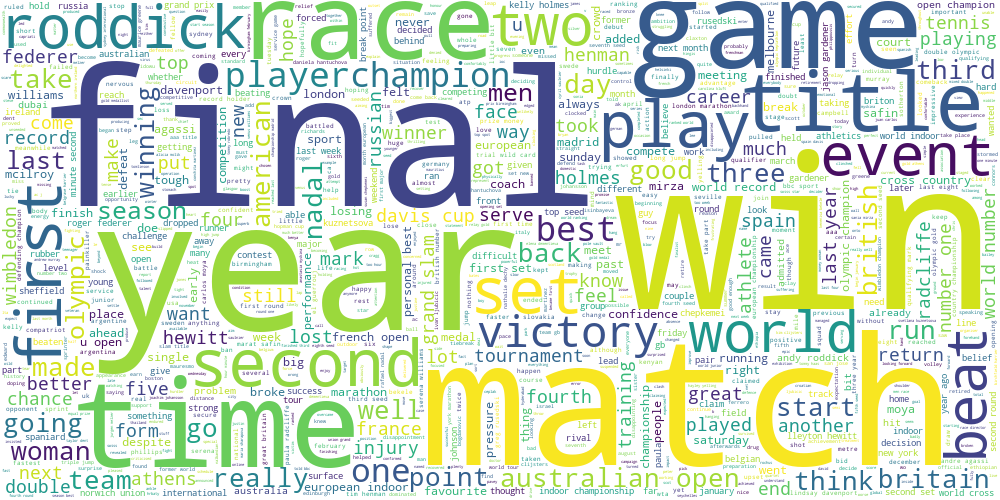

Cluster 7


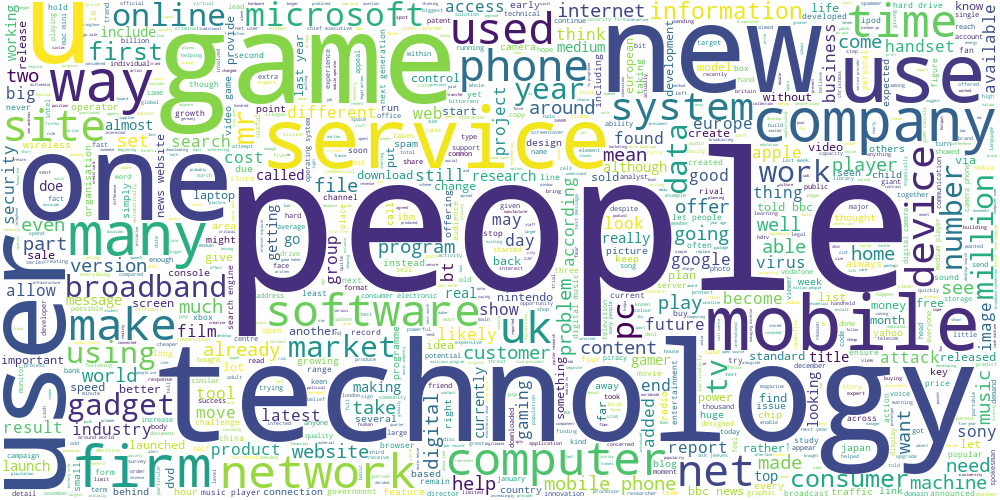

In [43]:
# у нас 8 кластеров - запустим цикл и посмотрим, какие облака получаются в разных кластерах
for i in range(8):
    text = data['text'][data['cluster_label'] == i]
    print('Cluster', i)
    display(draw_wordcloud(text))

Попробуем озаглавить каждую тему:

1. спортивные игры, чемпионаты, соревнования
2. развлекательная индустрия - фильмы, музыка
3. экономика
4. футбол?
5. политика
6. мировой бизнес
7. опять спортивные игры
8. технологии, IT

In [44]:
np.unique(data['category'])

array(['business', 'entertainment', 'politics', 'sport', 'tech'],
      dtype=object)

Если посмотреть на эти полученные нами облака слов, создается ощущение, что некоторые темы очень похожи друг на друга или повторяют одна другую. Это невольно наталкивает на мысль, что кластеров может быть меньше, чем количество, которое мы потребовали от алгоритма K-means. Так и есть - если подглядеть в разметку (столбец category), увидим, что у нас 5 категорий. Мне кажется, когда мы получаем больше кластеров, чем их есть на самом деле, тут могут возникать разные эффекты:
- это помогло нам выделить более узкие темы (Например, была тема "политика", а теперь получили "политика в Европе" и "политика в Азии"). Это может быть круто, для некоторых задач!
- **или же** мы просто получаем несколько очень похожих кластеров, что уже не так весело

**Задание 2.2 (0.5 балла).** Попробуем другой способ выделить ключевые слова для каждой темы. Помимо непосредственного разбиения объектов алгоритм K-Means получает центр каждого кластера. Попробуйте взять центры кластеров и посмотреть на слова, для которых значения соответствующих им признаков максимальны. Согласуются ли полученные слова с облаками тегов из прошлого задания?

**Ответ:** ответ ниже, после поиска ключевых слов

Я буду для каждого кластера искать три ключевых слова (ну, так интереснее, чем искать одно). Поэтому буду для каждого центра кластера выделять индексы трех наибольших значений, потом через векторайзер выведу, что это были за слова.

In [45]:
# пример как я хочу чтобы это выглядело
keywords_indexes = np.argsort(kmeans.cluster_centers_[0])[-3:]
print('Keywords for cluster', 0, ':')
for idx in keywords_indexes:
    print(vectorizer.get_feature_names()[idx], end=' ')

Keywords for cluster 0 :
ireland wale england 

Теперь засунем в цикл, чтобы вывести ключевые слова для всех кластеров.

In [46]:
for i in range(8):
    keywords_indexes = np.argsort(kmeans.cluster_centers_[i])[-3:]
    print('Keywords for cluster', i, ':')
    for idx in keywords_indexes:
        print(vectorizer.get_feature_names()[idx], end=' ')
    print(' ')

Keywords for cluster 0 :
ireland wale england  
Keywords for cluster 1 :
best award film  
Keywords for cluster 2 :
rate growth economy  
Keywords for cluster 3 :
game chelsea club  
Keywords for cluster 4 :
election labour mr  
Keywords for cluster 5 :
firm company mr  
Keywords for cluster 6 :
world champion open  
Keywords for cluster 7 :
people phone mobile  


Сравним с заголовками из предыдущего задания.
1. спортивные игры, чемпионаты, соревнования / по ключевым словам непонятно, тут скорее речь про страны из UK
2. развлекательная индустрия - фильмы, музыка / идеально соотносятся 
3. экономика / идеально соотносятся
4. футбол? / думаю да
5. политика / думаю да
6. мировой бизнес / думаю да
7. опять спортивные игры / идеально соотносятся 
8. технологии, IT / соотносятся

Вывод: в целом ключевые слова согласуются с облаками тегов!

**Задание 2.3 (1.5 балла).** В первой части мы сравнили три разных алгоритма кластеризации на географических данных. Проделаем то же самое для текстовых данных (в качестве признакого описания снова используем tf-idf). Получите три разбиения на кластеры с помощью алгоритмов K-Means, DBSCAN и спектральной кластеризации (на этот раз воспользуйтесь реализацией из `sklearn`). Для K-Means и спектральной кластеризации возьмите одинаковое небольшое число кластеров, подберите параметр `eps` метода DBSCAN так, чтобы получить приблизительно такое же число кластеров.

Далее, обучите двухмерные t-SNE представления над tf-idf признаками текстов. Визуализируйте эти представления для каждого алгоритма, раскрасив каждый кластер своим цветом. Лучше всего расположить визуализации на одном графике на трех разных сабплотах. Не забудьте, что DBSCAN помечает некоторые точки как шумовые (можно раскрасить их в отдельный цвет).

In [47]:
from sklearn.cluster import SpectralClustering

**K-means**

Поскольку раньше мы выдвинули смелое предположение о том, что кластеров на самом деле меньше, чем 8 (а реальных классов на самом деле вообще 5), будем обучать алгоритмы искать 5 кластеров.

In [48]:
kmeans = KMeans(n_clusters=5, random_state=420).fit(X)
# храню переменную с метками кластеров, чтобы удобно было к ним обращаться дальше в t-SNE
labels1 = kmeans.labels_
labels1

array([4, 4, 4, ..., 2, 2, 2])

In [49]:
np.unique(labels1)

array([0, 1, 2, 3, 4])

In [50]:
len(np.unique(labels1))

5

**DBSCAN**

In [51]:
dbscan = DBSCAN(eps=0.83).fit(X) # 0.83 to have 6 clusters
labels2 = dbscan.labels_
len(np.unique(labels2)) # посчитаем количество кластеров чтобы подобрать эпс

6

In [52]:
np.unique(labels2)

array([-1,  0,  1,  2,  3,  4], dtype=int64)

Для алгоритма DBSCAN параметр eps был подобран руками, чтобы получилось число кластеров = 6. Почему 6? Потому что -1 - так помечаются шумовые объекты (по идее), не относящиеся ни к одному из кластеров. Количество кластеров в DBSCAN нельзя задать ввиду особенностей алгоритма, но за это как раз отвечает параметр окрестности - эпсилон. Если он слишком большой - все объекты сливаются в единую кучу и считаются одним кластером. То есть мы допускаем большие расстояния между объектами одного кластера. 
В общем, параметр подобрали, но дальше мы увидим на визуализации, что это нам не помогло))

**Spectral clustering**

In [53]:
spec = SpectralClustering(n_clusters=5,random_state=420).fit(X)
labels3 = spec.labels_
labels3

array([1, 1, 1, ..., 1, 1, 0])

**T-SNE Visualisation**

In [54]:
from sklearn.manifold import TSNE
X_tsne = TSNE(n_components=2).fit_transform(X)

In [55]:
import matplotlib.pyplot as plt

Пример реализации T-SNE представления для алгоритма K-means. Код ниже из моей домашки по машонному обучению на ФЭНе.

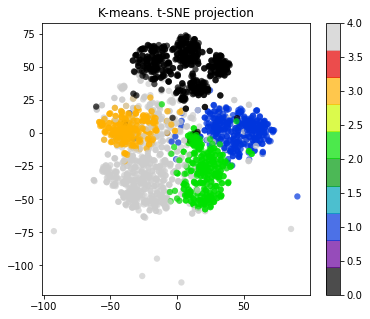

In [56]:
plt.figure(figsize=(6,5))
plt.scatter(X_tsne[:, 0], X_tsne[:, 1], c=labels1, 
            edgecolor='none', alpha=0.7, s=40,
            cmap=plt.cm.get_cmap('nipy_spectral', 10))
plt.colorbar()
plt.title('K-means. t-SNE projection');

Теперь отрисуем эту красоту для всех вышеперечисленных алгоритмов.

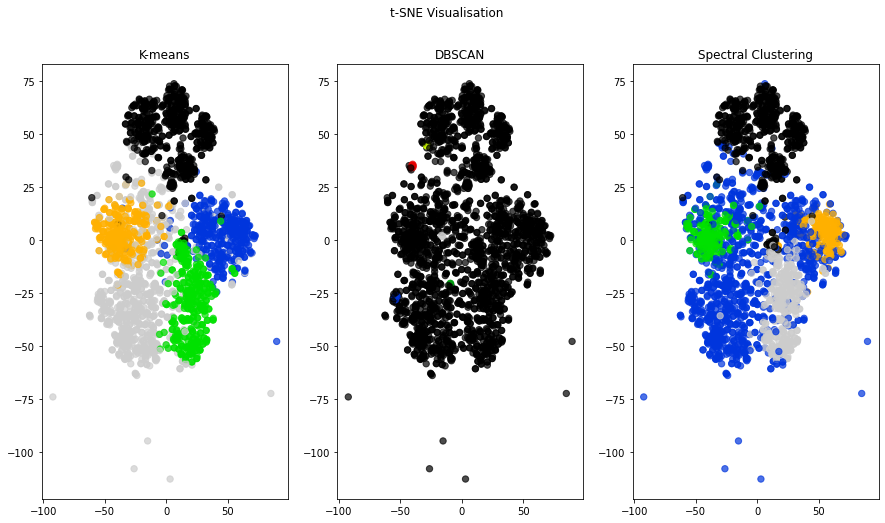

In [57]:
titles = ['K-means', 'DBSCAN', 'Spectral Clustering']
cluster_labels = [labels1, labels2, labels3]

fig, axs = plt.subplots(1, 3, figsize=(15,8))
fig.suptitle('t-SNE Visualisation')
for i in range(3):
    ax = axs[i]
    ax.scatter(X_tsne[:,0], X_tsne[:,1], c = cluster_labels[i], alpha=0.7, s=40,
            cmap=plt.cm.get_cmap('nipy_spectral', 10))
    ax.set_title(titles[i])

Прокомментируйте получившиеся результаты. Какой баланс кластеров получился у разных методов? Соотносятся ли визуализации для текстов с визуализациями для географических данных?

**Ответ:** 
 - Кажется, что визуализация для географических данных имеет больше смысла, чем для слов. Все-таки, распределения слов имеют большую размерность, и не всегда алгоритм t_SNE ее хорошо улавливает и визуализирует 
 - DBSCAN, судя по визуализации, справляется с тематическим моделированием хуже всего. Отчасти, это может быть вызвано неправильным подбором параметра эпсилон. С другой стороны, возможно этот метод не является в принципе хорошим для текстов. На графике видим, что почти все объекты попадают в черный кластер (шумовой?).
 - визуализация K-means для слов немного похожа на визуализацию для остановок - все таки имеем дело с методом, который кластеризует объекты по расстояниям/мере близости 
 - для спектральной кластеризации видим более сложное соотношение кластеров, нежели в K-means. Визуализация также немного похожа на визуализацию для остановок. Также, тут можно наблюдать большой синий кластер и его преобладание по всей выборке
 - K-means и SC дают похожие результаты по визуализации, но в K-means кластеры более сбалансированны.

**Задание 2.4 (1.5 балла).** Обучите модель латентного размещения Дирихле. Не забудьте, что она работает с мешком слов, а не с tf-idf признаками. Придумайте, как превратить распределение тем для текста в номер его кластера. Возьмите параметр `n_components` в 2-3 раза больше, чем число кластеров для K-Means. Получились ли темы более узкими от такого нововведения? Постройте облака тегов для нескольких наиболее удачных тем.

**Ответ:** ответ ниже после облаков тегов

In [58]:
from sklearn.feature_extraction.text import CountVectorizer

vectorizer = CountVectorizer() 
X = vectorizer.fit_transform(data['text'])

In [59]:
X.shape

(2225, 24207)

In [60]:
from sklearn.decomposition import LatentDirichletAllocation
lda = LatentDirichletAllocation(n_components=15, random_state=420)
X_transformed = lda.fit_transform(X)
X_transformed

array([[3.05811298e-04, 3.05811744e-04, 4.54888276e-01, ...,
        3.05810841e-04, 3.05810881e-04, 3.05810862e-04],
       [3.14465937e-04, 1.29739953e-01, 3.14466520e-04, ...,
        3.14465978e-04, 3.14465820e-04, 3.14465996e-04],
       [4.56621511e-04, 4.56621894e-04, 4.56621559e-04, ...,
        4.56621346e-04, 4.56621445e-04, 4.56621542e-04],
       ...,
       [1.26742908e-04, 5.06491072e-01, 5.85719328e-02, ...,
        1.43332568e-01, 1.26743015e-04, 1.26742949e-04],
       [2.66276205e-01, 3.17461284e-04, 3.17460945e-04, ...,
        3.17460926e-04, 3.17460806e-04, 3.17461002e-04],
       [6.13429229e-02, 1.11216686e-02, 4.62001307e-05, ...,
        3.28068646e-01, 4.62002224e-05, 7.06142770e-02]])

In [61]:
X_transformed.shape

(2225, 15)

Поскольку выход LDA - это распределение на темах и их всего 15 штук, будем считать кластером индекс наиболее вероятной темы.

In [62]:
lda_labels = np.argmax(X_transformed, axis=1)
lda_labels

array([ 2,  9,  7, ...,  1,  5, 11], dtype=int64)

In [63]:
len(np.unique(lda_labels))

15

In [64]:
data['lda_label'] = lda_labels
data.head()

,category,filename,title,content,raw_text,text,cluster_label,lda_label
0,business,001.txt,Ad sales boost Time Warner profit,Quarterly profits at US media giant TimeWarne...,Ad sales boost Time Warner profit Quarterly pr...,ad sale boost time warner profit quarterly pro...,5,2
1,business,002.txt,Dollar gains on Greenspan speech,The dollar has hit its highest level against ...,Dollar gains on Greenspan speech The dollar ha...,dollar gain greenspan speech dollar hit highes...,2,9
2,business,003.txt,Yukos unit buyer faces loan claim,The owners of embattled Russian oil giant Yuk...,Yukos unit buyer faces loan claim The owners o...,yukos unit buyer face loan claim owner embattl...,5,7
3,business,004.txt,High fuel prices hit BA's profits,British Airways has blamed high fuel prices f...,High fuel prices hit BA's profits British Airw...,high fuel price hit ba profit british airway b...,5,9
4,business,005.txt,Pernod takeover talk lifts Domecq,Shares in UK drinks and food firm Allied Dome...,Pernod takeover talk lifts Domecq Shares in UK...,pernod takeover talk lift domecq share uk drin...,5,9


Нарисуем все темы/кластеры, которые у нас получились быстренько с помощью кода, который уже был использован в одном из предыдущих заданий. Потом посмотрим на них, и самые интересные из полученных облаков выведем отдельно и попытаемся интерпретировать.

Cluster 0


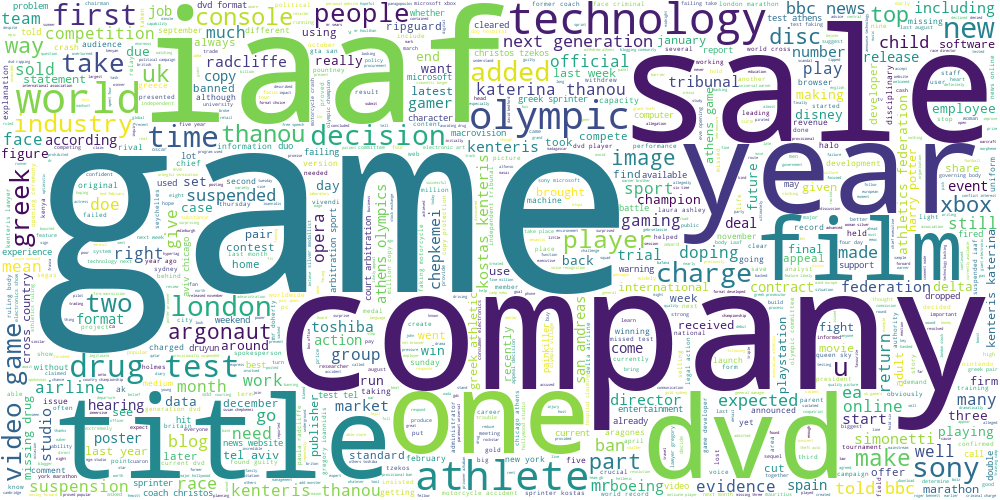

Cluster 1


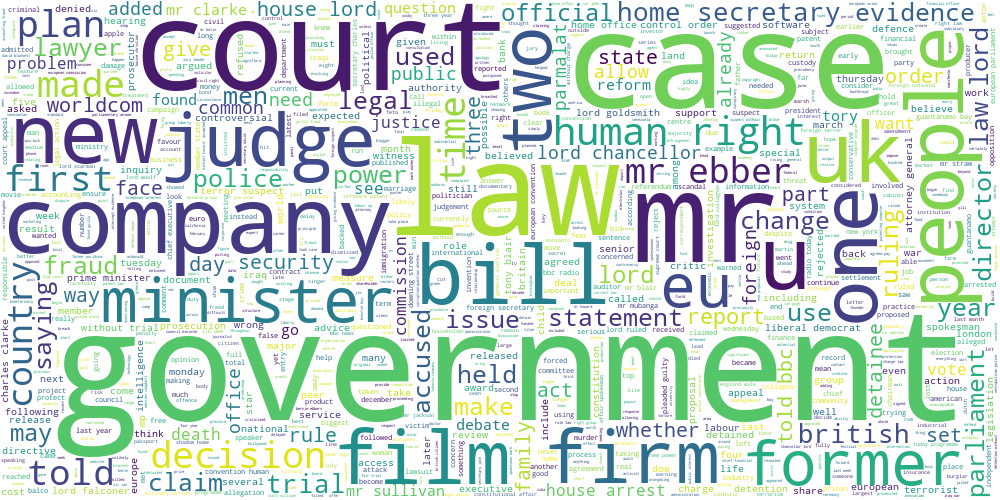

Cluster 2


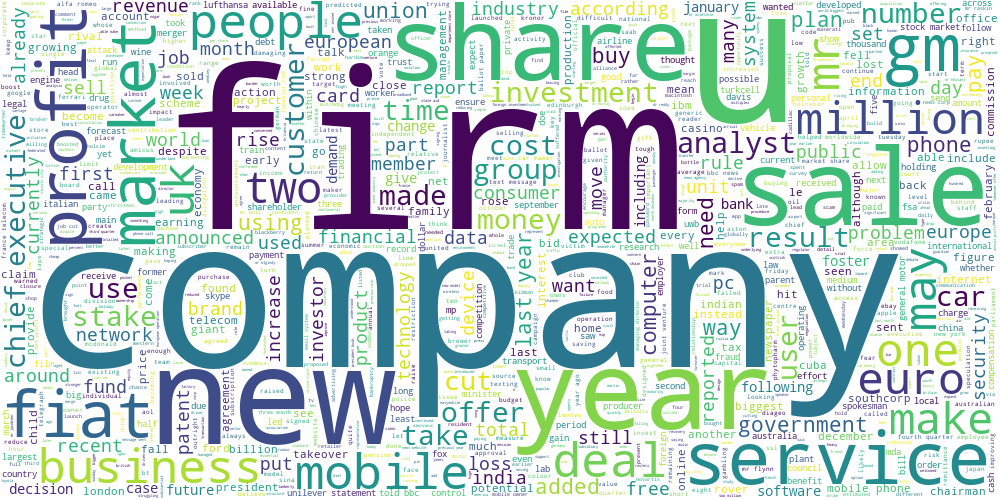

Cluster 3


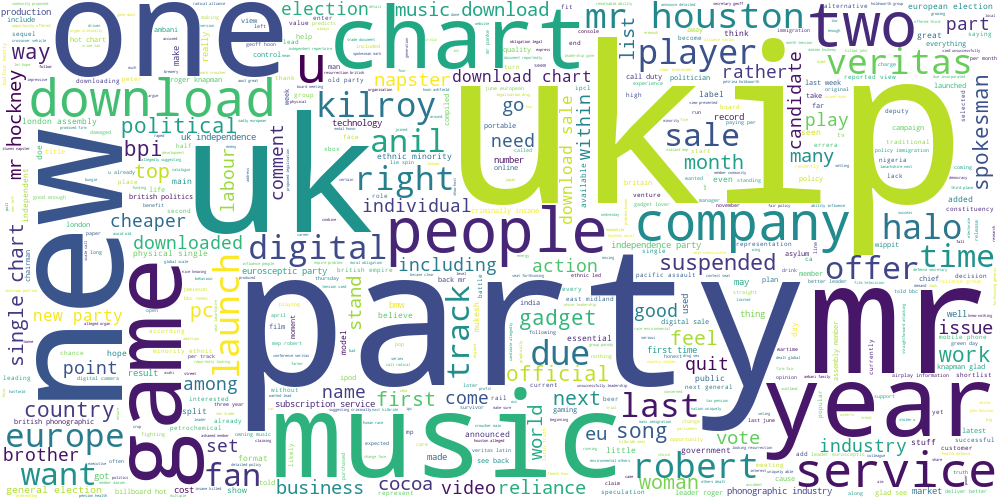

Cluster 4


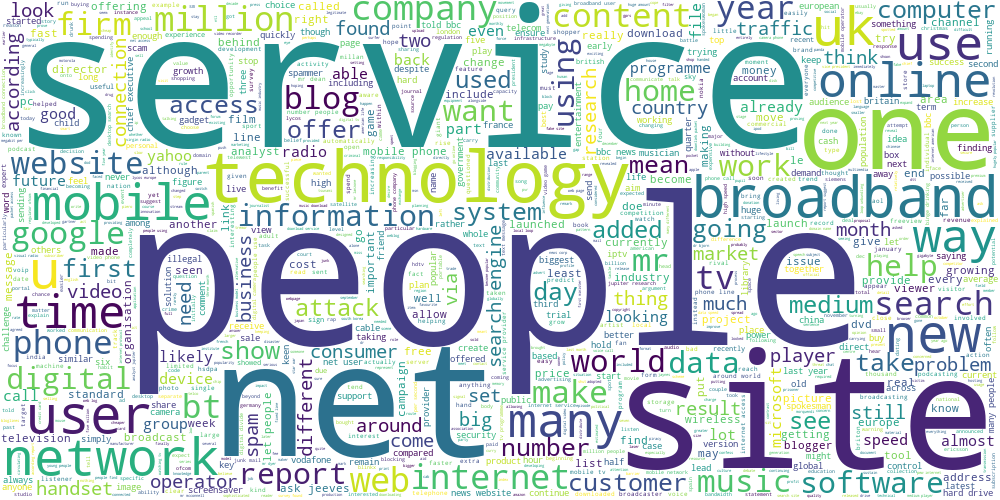

Cluster 5


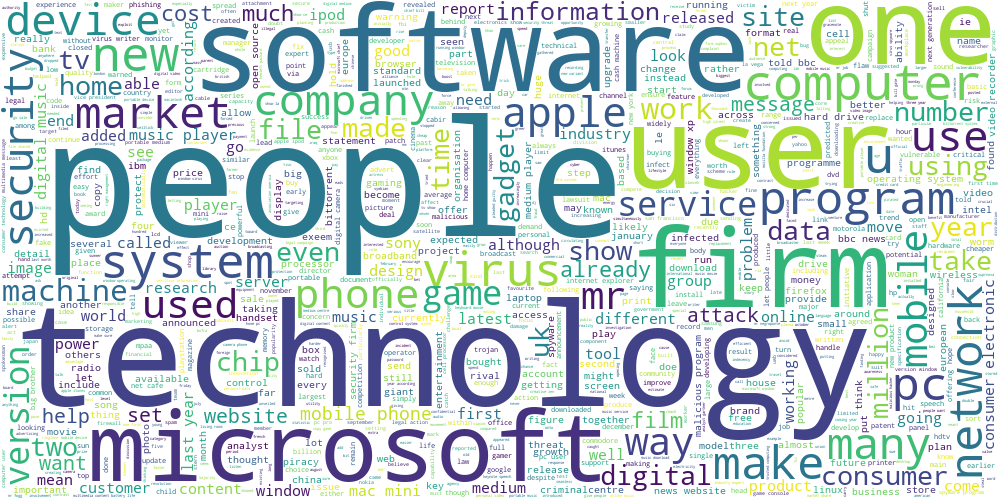

Cluster 6


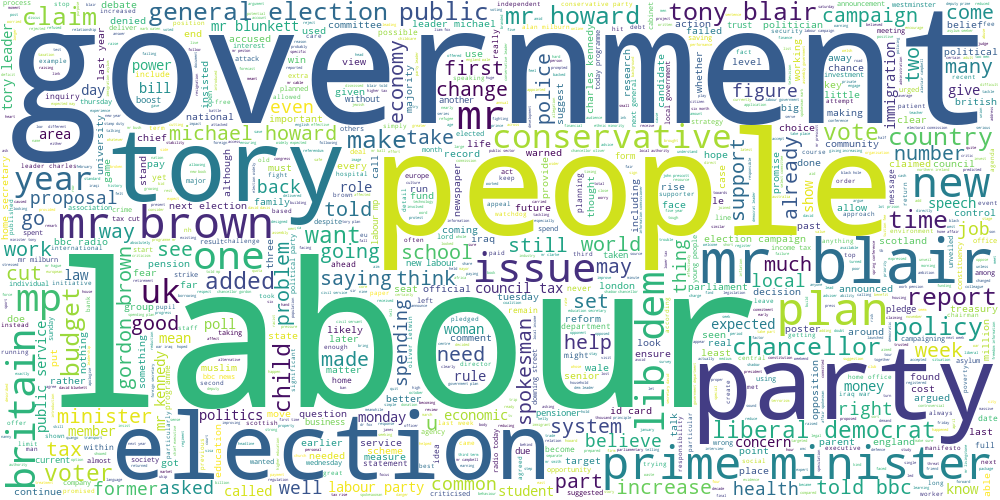

Cluster 7


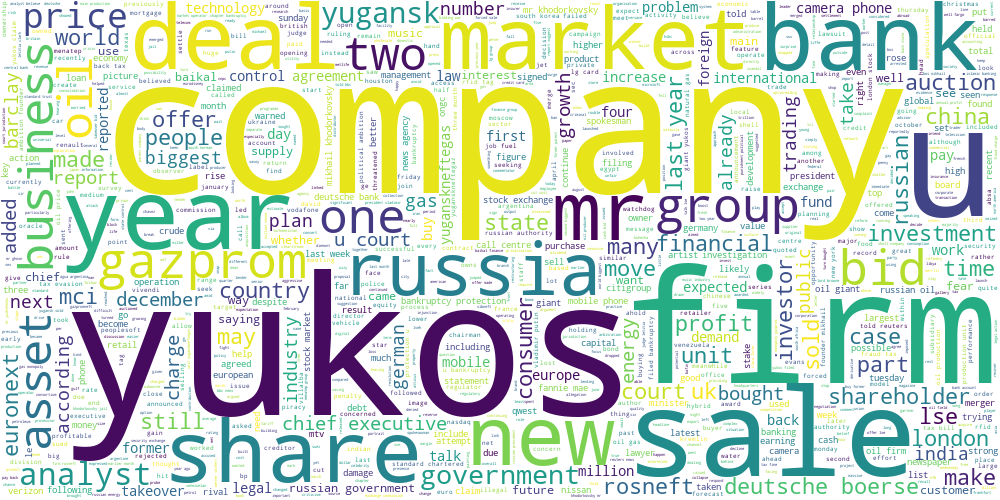

Cluster 8


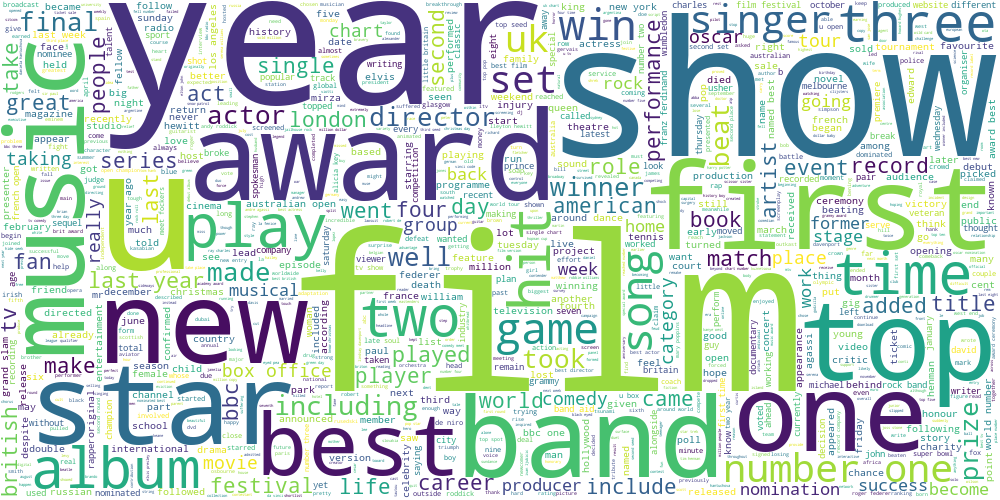

Cluster 9


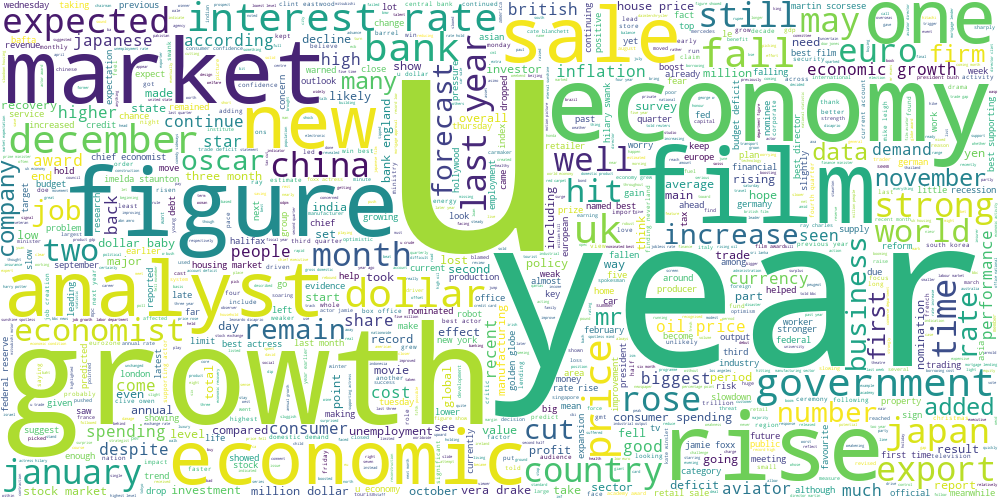

Cluster 10


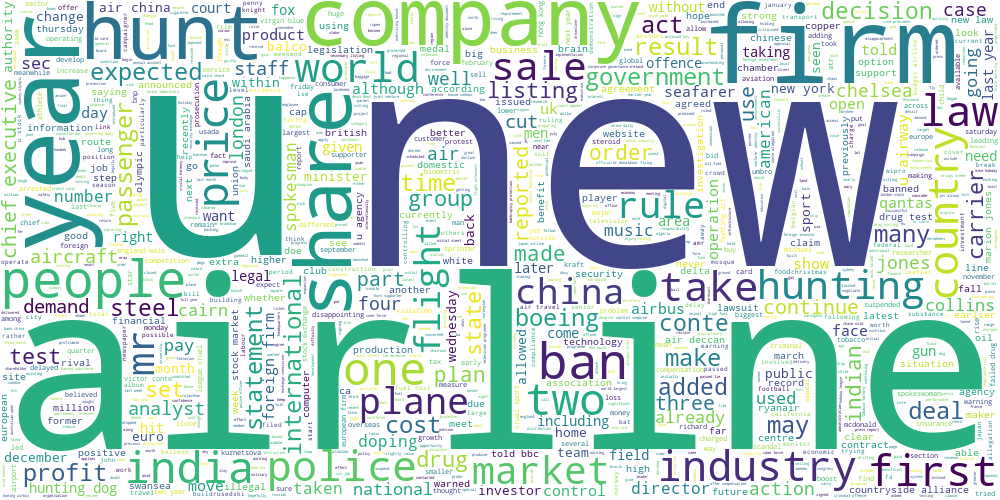

Cluster 11


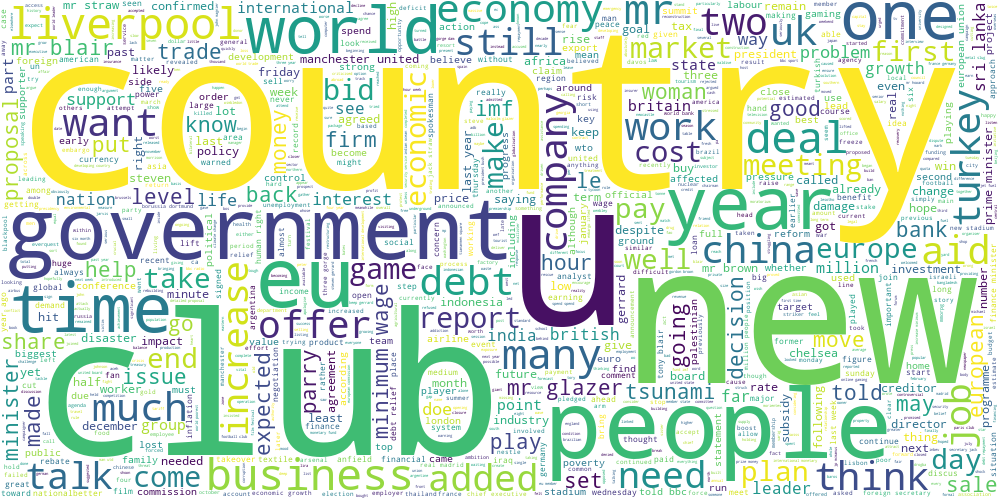

Cluster 12


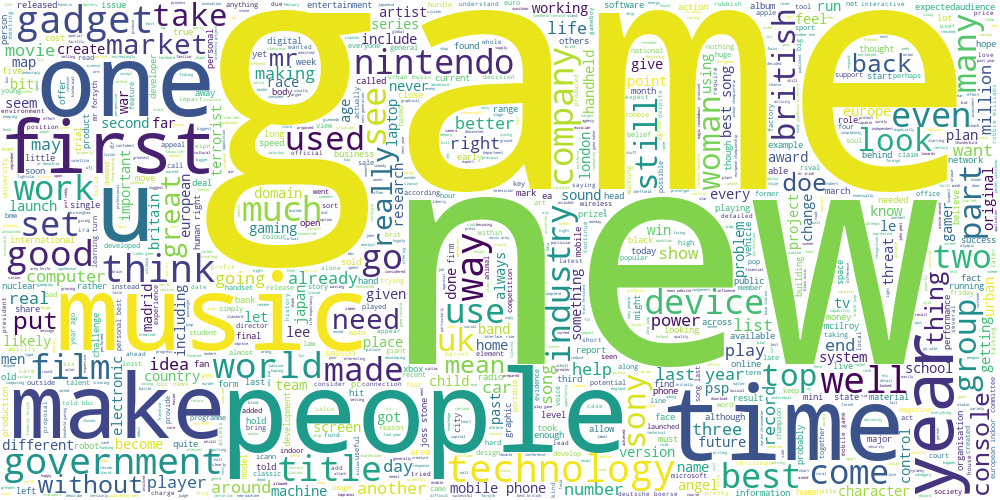

Cluster 13


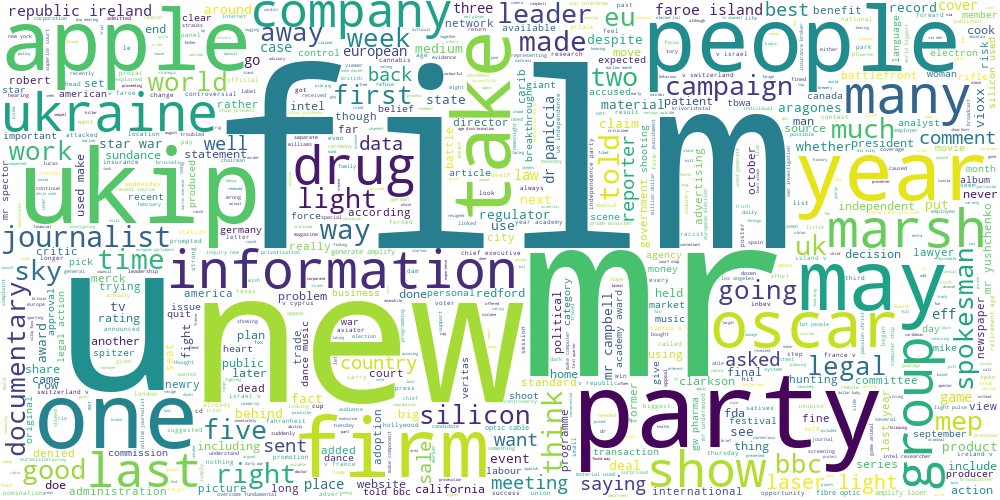

Cluster 14


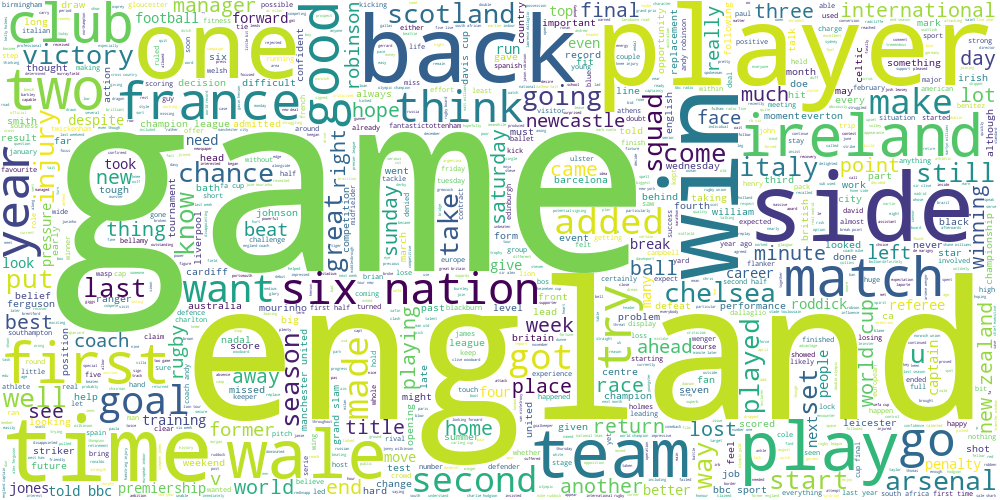

In [65]:
for i in range(15):
    text = data['text'][data['lda_label'] == i]
    print('Cluster', i)
    display(draw_wordcloud(text))

Cluster 1


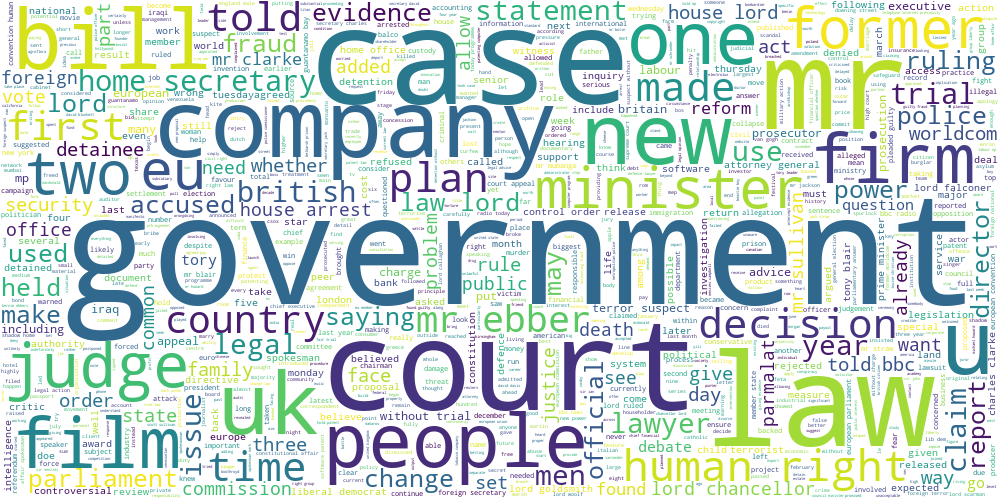

Cluster 7


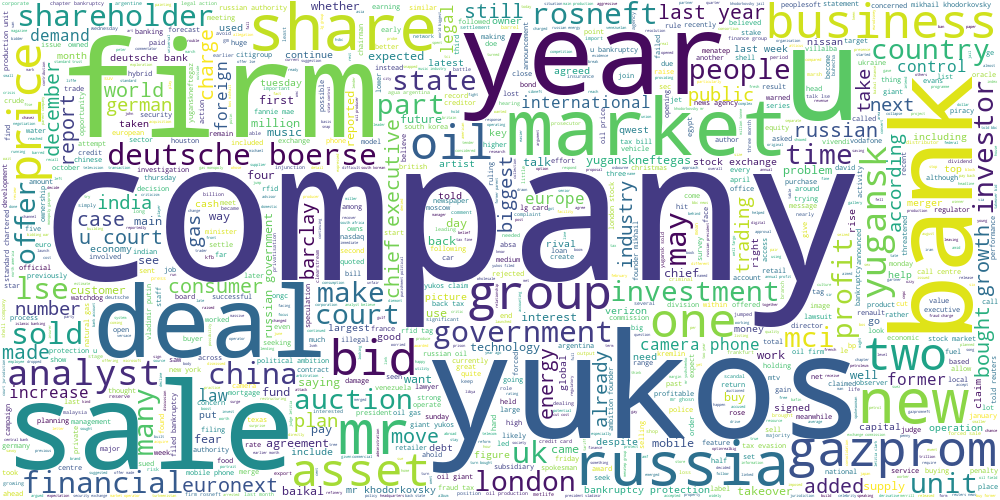

Cluster 10


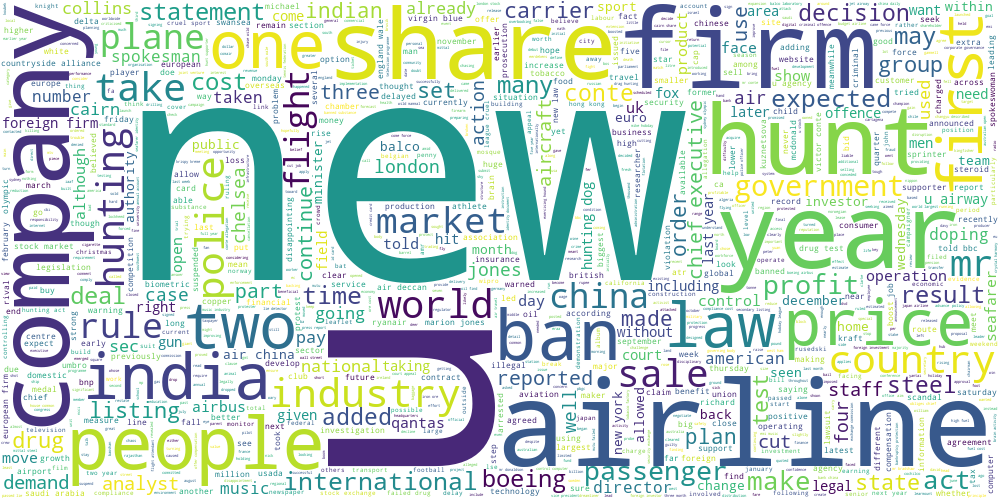

In [66]:
for i in [1,7,10]:
    text = data['text'][data['lda_label'] == i]
    print('Cluster', i)
    display(draw_wordcloud(text))

Темы, которые у нас получились:

Кластер 1: Юридическая сфера

Кластер 7: Рынок нефтегаза 

Кластер 14: Рынок авиаперелетов 


**Ответ на вопрос задания:**
Получились ли темы более узкими? Да, но не всегда. У нас получилось 15 тем, из которых я выбрала три наиболее характерные. То есть по облакам тегов реально можно увидеть, что темы углубляют те, которые были раньше (например, была просто экономика, а теперь есть отдельные кластеры для нефтегазовой экономики и для перелетов)

Если же посмотреть на все остальные темы, иногда в облаках тегов можно увидеть что слова из разных тем/кластеров/категорий смешиваются. Иногда видим те же самые результаты, как для предыдущей модели. Также, можно увидеть, что темы повторяются в разныз кластерах.

## Часть 3. Transfer learning для задачи классификации текстов

**Задание 3.1 (0.5 балла).** Вспомним, что у нас есть разметка для тематик статей. Попробуем обучить классификатор поверх unsupervised-представлений для текстов. Рассмотрите три модели:

* Логистическая регрессия на tf-idf признаках
* K-Means на tf-idf признаках + логистическая регрессия на расстояниях до центров кластеров
* Латентное размещение Дирихле + логистическая регрессия на вероятностях тем

Разделите выборку на обучающую и тестовую, замерьте accuracy на обоих выборках для всех трех моделей. Параметры всех моделей возьмите равными значениям по умолчанию.

In [67]:
X = data['text']
y = data['category']

Поскольку в следующем задании я начала путаться, что и в каком порядке преобразовывать и обучать, пришлось переписать код и здесь тоже. Не знаю, насколько по умному нужно было делать и насколько у меня это получилось, но вот что я делаю:

1) Исходные данные это просто тексты (колонка text)

2) Разбиваю тексты на трейн и тест.

3) Обучаю векторайзер **только** на трейне. Кластеризацию/LDA обучаю тоже только на трейновой части

4) Делаю трансформы на трейне и на тесте

5) Обучаю логистическую регрессию на трейне

6) Замеряю качество на трейне и на тесте

In [68]:
(X.shape, y.shape)

((2225,), (2225,))

**Logistic Regression**

In [74]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

In [75]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=420)

vectorizer = TfidfVectorizer().fit(X_train)
X_train = vectorizer.transform(X_train)
X_test = vectorizer.transform(X_test)

clf = LogisticRegression(random_state=420).fit(X_train, y_train)
y_pred_train = clf.predict(X_train)
y_pred_test = clf.predict(X_test)

train_acc = accuracy_score(y_train, y_pred_train)
test_acc = accuracy_score(y_test, y_pred_test)
print('TF-IDF Logistic Regression \nTrain accuracy score:', train_acc, '\nTest accuracy score', test_acc)

TF-IDF Logistic Regression 
Train accuracy score: 0.9970023980815348 
Test accuracy score 0.9748653500897666


**K-means + Logistic Regression на расстояниях**

In [76]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=420)

vectorizer = TfidfVectorizer().fit(X_train)
X_train = vectorizer.transform(X_train)
X_test = vectorizer.transform(X_test)

kmeans = KMeans(random_state=420).fit(X_train)
X_train = kmeans.transform(X_train)
X_test = kmeans.transform(X_test)

clf = LogisticRegression(max_iter = 500, random_state=420).fit(X_train, y_train)
y_pred_train = clf.predict(X_train)
y_pred_test = clf.predict(X_test)

train_acc = accuracy_score(y_train, y_pred_train)
test_acc = accuracy_score(y_test, y_pred_test)
print('K-means distances Logistic Regression \nTrain accuracy score:', train_acc, '\nTest accuracy score', test_acc)

K-means distances Logistic Regression 
Train accuracy score: 0.8261390887290168 
Test accuracy score 0.8509874326750448


**LDA + Logistic Regression**

In [77]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=420)

vectorizer = CountVectorizer().fit(X_train)
X_train = vectorizer.transform(X_train)
X_test = vectorizer.transform(X_test)

lda = LatentDirichletAllocation(random_state=420).fit(X_train)
X_train = lda.transform(X_train)
X_test = lda.transform(X_test)

clf = LogisticRegression(max_iter = 500, random_state=420).fit(X_train, y_train)
y_pred_train = clf.predict(X_train)
y_pred_test = clf.predict(X_test)

train_acc = accuracy_score(y_train, y_pred_train)
test_acc = accuracy_score(y_test, y_pred_test)
print('LDA distributions Logistic Regression \nTrain accuracy score:', train_acc, '\nTest accuracy score', test_acc)

LDA distributions Logistic Regression 
Train accuracy score: 0.894484412470024 
Test accuracy score 0.9353680430879713


У какой модели получилось лучшее качество? С чем это связано?

**Ответ:**
Лучшее качество как на трейне, так и на тесте, демонстрирует первая модель - логистическая регрессия на TF-IDF признаках. Качество, кстати, 0,97 вообще близкое к идеальному. Мне хочется предположить, что это связано с тем, что у нас большая размерность данных - больше признаков.(около 20К - помнится из предыдущих заданий) Когда мы строим TF-IDF представления, признаками являются сами слова. Получается у нас есть достаточно большой массив данных, в которой модели проще найти всякие хитрые закономерности и хорошо обучиться. 

Во второй и третьей модели признаков меньше: для второй признаки это расстояния до центров кластеров. (у нас 8) Число признаков = числу кластеров. В третьей распределение на темах. Число признаков = числу тем. (у нас 15)

Вторая модель (LR на K-means) справляется хуже всего.
Тем не менее, у всех моделей достаточно высокое качество. А для 2 и 3 качество на тесте выше качества на трейне! Это интересно. Думаю, в этих моделях есть какой-то дзен, который побеждает потенциальную проблему переобучения. 

**Задание 3.2 (1.5 балла).** Теперь просимулируем ситуацию слабой разметки, которая часто встречается в реальных данных. Разделим обучающую выборку в пропорции 5:65:30. Будем называть части, соответственно, размеченный трейн, неразмеченный трейн и валидация.

Все unsupervised-алгоритмы (векторайзеры и алгоритмы кластеризации) запускайте на всем трейне целиком (размеченном и неразмеченном, суммарно 70%), а итоговый классификатор обучайте только на размеченном трейне (5%). Подберите гиперпараметры моделей по качеству на валидации (30%), а затем оцените качество на тестовой выборке (которая осталась от прошлого задания). Не скромничайте при подборе числа кластеров, сейчас нас интересует не интерпретируемое разбиение выборки, а итоговое качество классификации. 

Код ниже закомменчен по причине того, что эти функции я буду вызывать отдельно внутри ячейки для каждого алгоритма. Но не удален, потому что тут видно логику, что и в каком порядке делится:

1) Исходные данные делю на трейн и тест 75%/25%

2) Трейн делю на еще один трейн (_train1) и валидацию  70%/30%

3) Train1 делю на неразмеченный (unlabeled) и размеченный (labeled) 5/70 / 65/70

In [78]:
#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=420)
#X_train1, X_val, y_train1, y_val = train_test_split(X_train, y_train, test_size=0.3, random_state=420)
#X_train_unlabeled, X_train_labeled, y_train_unlabeled, y_train_labeled = train_test_split(X_train1, y_train1, test_size=5/70, random_state=420)

**Logistic Regression на TF-IDF**

In [79]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=420)
X_train1, X_val, y_train1, y_val = train_test_split(X_train, y_train, test_size=0.3, random_state=420)

# преобразование текстовых данных
vectorizer = TfidfVectorizer().fit(X_train1)
X_train1 = vectorizer.transform(X_train1)
X_val =  vectorizer.transform(X_val)
X_test = vectorizer.transform(X_test)

# делим после преобразования
X_train_unlabeled, X_train_labeled, y_train_unlabeled, y_train_labeled = train_test_split(X_train1, y_train1, test_size=5/70, random_state=420)

# подбор гиперпараметров для LR
score_list = []
hp_list = []
for tol in [1e-4, 1e-3, 1e-2]:
    for C in [0.01, 0.1, 1, 10, 100]:
        clf = LogisticRegression(solver='saga', max_iter=1000, tol=tol, C=C, random_state=420).fit(X_train_labeled, y_train_labeled)
        y_pred = clf.predict(X_val)
        score = accuracy_score(y_val, y_pred)
        score_list.append(score)
        hp_list.append((tol, C))

# вывод оптимальных гиперпараметров для LR и лучшего скора на валидации
best_parameters = hp_list[np.argmax(np.array(score_list))]
best_score = max(np.array(score_list))
print('Best parameters:', best_parameters, '\nBest validation score:', best_score)

Best parameters: (0.01, 100) 
Best validation score: 0.9141716566866267


После того, как нашли оптимальные гиперпараметры, обучим новый алгоритм с ними и замерим финальную accuracy на тестовой части выборки. Тестовая - это та, которую ни один из использованных алгоритмов "не видел".

In [80]:
clf = LogisticRegression(solver='saga', max_iter=1000, tol=best_parameters[0], C=best_parameters[1], random_state=420).fit(X_train_labeled, y_train_labeled)

y_pred = clf.predict(X_test)
score = accuracy_score(y_test, y_pred)
print('TF-IDF Logistic Regression \nTest accuracy score', score) 

TF-IDF Logistic Regression 
Test accuracy score 0.926391382405745


**K-means + Logistic Regression на расстояниях**

In [81]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=420)
X_train1, X_val, y_train1, y_val = train_test_split(X_train, y_train, test_size=0.3, random_state=420)

# преобразование текстовых данных
vectorizer = TfidfVectorizer().fit(X_train1)
X_train1 = vectorizer.transform(X_train1)
X_val =  vectorizer.transform(X_val)
X_test = vectorizer.transform(X_test)

# n_clusters подбираю вручную
kmeans = KMeans(n_clusters = 150, random_state=420).fit(X_train1)
X_train1 = kmeans.transform(X_train1)
X_val = kmeans.transform(X_val)
X_test = kmeans.transform(X_test)

# делим после преобразования
X_train_unlabeled, X_train_labeled, y_train_unlabeled, y_train_labeled = train_test_split(X_train1, y_train1, test_size=5/70, random_state=420)

# подбор гиперпараметров для LR
score_list = []
hp_list = []
for tol in [1e-4, 1e-3, 1e-2]:
    for C in [0.01, 0.1, 1, 10, 100]:
        clf = LogisticRegression(solver='saga', max_iter=5000, tol=tol, C=C, random_state=420).fit(X_train_labeled, y_train_labeled)
        y_pred = clf.predict(X_val)
        score = accuracy_score(y_val, y_pred)
        score_list.append(score)
        hp_list.append((tol, C))

# вывод оптимальных гиперпараметров для LR и лучшего скора на валидации
best_parameters = hp_list[np.argmax(np.array(score_list))]
best_score = max(np.array(score_list))
print('Best parameters:', best_parameters, '\nBest validation score:', best_score)

Best parameters: (0.0001, 100) 
Best validation score: 0.9281437125748503


In [82]:
clf = LogisticRegression(solver='saga', max_iter=5000, tol=best_parameters[0], C=best_parameters[1], random_state=420).fit(X_train_labeled, y_train_labeled)

y_pred = clf.predict(X_test)
score = accuracy_score(y_test, y_pred)
print('K-means distances Logistic Regression \nTest accuracy score', score) 

K-means distances Logistic Regression 
Test accuracy score 0.9515260323159784


**LDA + Logistic Regression**

In [83]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=420)
X_train1, X_val, y_train1, y_val = train_test_split(X_train, y_train, test_size=0.3, random_state=420)

# преобразование текстовых данных
vectorizer = CountVectorizer().fit(X_train1)
X_train1 = vectorizer.transform(X_train1)
X_val =  vectorizer.transform(X_val)
X_test = vectorizer.transform(X_test)

# n_components подбираю вручную
lda = LatentDirichletAllocation(n_components=15, random_state=420).fit(X_train1)
X_train1 = lda.transform(X_train1)
X_val = lda.transform(X_val)
X_test = lda.transform(X_test)

# делим после преобразования
X_train_unlabeled, X_train_labeled, y_train_unlabeled, y_train_labeled = train_test_split(X_train1, y_train1, test_size=5/70, random_state=420)

# подбор гиперпараметров для LR
score_list = []
hp_list = []
for tol in [1e-4, 1e-3, 1e-2]:
    for C in [0.01, 0.1, 1, 10, 100]:
        clf = LogisticRegression(solver='saga', max_iter=5000, tol=tol, C=C, random_state=420).fit(X_train_labeled, y_train_labeled)
        y_pred = clf.predict(X_val)
        score = accuracy_score(y_val, y_pred)
        score_list.append(score)
        hp_list.append((tol, C))

# вывод оптимальных гиперпараметров для LR и лучшего скора на валидации
best_parameters = hp_list[np.argmax(np.array(score_list))]
best_score = max(np.array(score_list))
print('Best parameters:', best_parameters, '\nBest validation score:', best_score)

Best parameters: (0.01, 10) 
Best validation score: 0.9201596806387226


In [84]:
clf = LogisticRegression(solver='saga', max_iter=5000, tol=best_parameters[0], C=best_parameters[1], random_state=420).fit(X_train_labeled, y_train_labeled)

y_pred = clf.predict(X_test)
score = accuracy_score(y_test, y_pred)
print('LDA distributions Logistic Regression \nTest accuracy score', score) 

LDA distributions Logistic Regression 
Test accuracy score 0.9048473967684022


Как изменились результаты по сравнению с обучением на полной разметке? Сделайте выводы.

**Ответ:** давайте буду сразу делать выводы

**Выводы:**
- Посмотрите как чудесно! Мы симулировали слабую разметку, а качество по прежнему очень высокое для каждой из трех моделей! 
- Ну, для начала, стоит отметить, что сравнивать результаты моделей из этого и предыдущего задания, кажется немного запрещенным, поскольку здесь очень сильно результаты зависели от хорошего подбора гиперпараметров. Я попыталась сделать такой подбор, при котором доля верных ответов будет 0.90+, при этом чтобы все методы внутри лог.регрессий сходились и обучение не занимало 300 лет. 
- Для первой модели (лог.рег на TF-IDF) качество на тесте упало на ~0,04. То есть в ситуации слабой разметки, она справляется хуже. Однако, можно предположить, если еще несколько часов потратить на подбор гиперпараметров, наверное, можно будет докрутить accuracy до уровня 0,97.
- Для второй модели (лог.рег на K-means) качество выросло на 0,1! ого! был применен запрещенный прием увеличить число кластеров до 150. Ну, как и сказано в задании, сейчас для нас важна не интерпретируемость, а качество классификации. 
- Для третьей модели (лог.рег на LDA) качество упало на ~0,03. Ситуация похожа на первую модель. 
- Теперь лучшей моделью является лог.регрессия на кластерных расстояниях после преобразования K-means. А при нормальной разметке она давала худший результат. *Опять же, не хочется так вот сразу, потому что количество кластеров было 8 а стало 150, все очень сильно упирается в гиперпараметры*
- Теперь худшей моделью является лог.регрессия на LDA
- Главный вывод, думаю, будет таков: даже несмотря на то, что у нас случилась ситуация **слабой разметки**, при хорошем подборе гиперпараметров можно по-прежнему получать высокие показатели accuracy, сравнимые с обучением на полной разметке, причем это работает для каждой из моделей. Вдохновляюще

## Бонус

**Задание 4 (1 балл)**. Разберитесь с semi-supervised методами, которые реализованы в `sklearn` и примените их к заданию 3.2. Получилось ли добиться лучшего качества? Сделайте выводы.

In [85]:
X = data['text']
y = data['category']
y

0       business
1       business
2       business
3       business
4       business
          ...   
2220        tech
2221        tech
2222        tech
2223        tech
2224        tech
Name: category, Length: 2225, dtype: object

In [86]:
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
y = le.fit_transform(y)
y

array([0, 0, 0, ..., 4, 4, 4])

In [87]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=420)
X_train1, X_val, y_train1, y_val = train_test_split(X_train, y_train, test_size=0.3, random_state=420)

X_train_unlabeled, X_train_labeled, y_train_unlabeled, y_train_labeled = train_test_split(X_train1, y_train1, test_size=5/70, random_state=420)
y_train_unlabeled = -1 * np.ones(y_train_unlabeled.shape)

X_train = np.concatenate((X_train_labeled, X_train_unlabeled), axis=0)
y_train = np.concatenate((y_train_labeled, y_train_unlabeled), axis=0)

vectorizer = TfidfVectorizer().fit(X_train)
X_train = vectorizer.transform(X_train).toarray()
X_test = vectorizer.transform(X_test)

from sklearn.semi_supervised import LabelPropagation
label_prop_model = LabelPropagation(gamma=15, max_iter = 5000)
label_prop_model.fit(X_train, y_train)
y_pred = label_prop_model.predict(X_test)
accuracy_score(y_test, y_pred)

0.8491921005385996

**Выводы:**
- я попыталась немного подобрать гиперпараметры в LabelPropagation, но это пока что лучший результат
- качество не сильно хуже, но все таки меньше, чем в моих реализациях лог.регрессий в задании 3.2
- поэтому пока что делаем промежуточный вывод, что semi-supervised справляется хуже
- думаю здесь имеет смысл (на будущее) попробовать другие методы и еще получше подобрать гиперпараметры и возможно качество будет > 0,9 

**Задание 5 (1 балл)**. На занятиях мы обсуждали, что метрика [BCubed](https://www.researchgate.net/profile/Julio-Gonzalo-2/publication/225548032_Amigo_E_Gonzalo_J_Artiles_J_et_alA_comparison_of_extrinsic_clustering_evaluation_metrics_based_on_formal_constraints_Inform_Retriev_12461-486/links/0c96052138dbb99740000000/Amigo-E-Gonzalo-J-Artiles-J-et-alA-comparison-of-extrinsic-clustering-evaluation-metrics-based-on-formal-constraints-Inform-Retriev-12461-486.pdf) хорошо подходит для сравнения алгоритмов кластеризации, если нам известно настоящее разделение на кластеры (gold standard). Реализуйте подсчет метрики BCubed и сравните несколько алгоритмов кластеризации на текстовых данных из основного задания. В качестве gold standard используйте разметку category.

In [ ]:
# YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿

**Задание 6 (2 баллa)**. Спектральная кластеризация, по сути, является обычной кластеризацией KMeans поверх эмбеддингов объектов, которые получаются из лапласиана графа. А что, если мы попробуем построить эмбеддинги каким-нибудь другим способом? В этом задании мы предлагаем вам проявить немного фантазии. Возьмите какие-нибудь данные высокой размерности, чтобы задача обучения эмбеддингов имела смысл (например, картинки или тексты, желательно выбрать что-нибудь оригинальное). Придумайте или найдите какой-нибудь метод обучения эмбеддингов, примените его к данным и кластеризуйте полученные представления. Если чувствуете в себе достаточно силы, можете попробовать что-нибудь нейросетевое. Сравните ваш подход с базовыми алгоритмами кластеризации, которое мы рассмотрели в основном задании, не забывайте про визуализации! Ключевые слова для вдохновения: ***KernelPCA***, ***UMAP***, ***autoencoders***, ***gensim***. 

In [ ]:
# YOUR CODE HERE ‿︵‿︵ヽ(°□° )ノ︵‿︵‿

**Задание 7 (1 балл)**. В нынешние непростые времена как никогда важно уметь отвлекаться и находить себе развлечение. Мы поощряем не только предметное, но и духовное развитие. Поэтому, чтобы заработать балл за этот социализационный бонус, сходите на какую-нибудь выставку или в музей, напишите небольшой отчетик о ваших впечатлениях и добавьте фотопруфы в ноутбук при сдаче. Можете объединиться с одногруппниками/однокурсниками, а также пригласить ассистентов/преподавателей, они тоже будут рады выбраться куда-нибудь. Для вдохновения приведем ссылку на актуальные выставки [новой](https://www.youtube.com/watch?v=dQw4w9WgXcQ&ab) и [старой Третьяковки](https://www.youtube.com/watch?v=xm3YgoEiEDc) (но совсем не обязательно посещать именно их).

Это, конечно, не совсем выставка, но 4 апреля я сходила в кино на показ фильма "Брат". Классика. + монетку в копилочку медленно умирающему российскому кинопрокату. Фильм "Брат" я уже смотрела, но недавняя гиперфиксация на музыке группы Nautilus Pompilius, понесла меня в кинотеатр смотреть эту великую картину еще раз... 
Фотографий нет, но если и вам захочется освежить воспоминания о нестареющей классике, предлагаю посмотреть [вот этот обзор от кинопоиска](https://www.youtube.com/watch?v=ka2BiSTBbNA&ab_channel=%D0%9A%D0%B8%D0%BD%D0%BE%D0%BF%D0%BE%D0%B8%D1%81%D0%BA) :)
Ну, и, конечно: послушать [вот это](https://music.yandex.ru/album/10519). 

Кстати, мне очень понравилась домашка